<a href="https://colab.research.google.com/github/dinog0d/Lab_Biose_Dinoequipo/blob/main/Proyecto_3/Proyecto3_LauraLlanos_DaironMontes_AnnyRaigoza.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Proyecto 3: Filtros


## Contexto del problema:

> Las enfermedades cardiovasculares son una de las principales causas de muerte en todo el mundo, y la Organización Mundial de la Salud (OMS) estimó que 17,9 millones de personas murieron en 2019 por este tipo de enfermedades. Las enfermedades cardiovasculares están relacionadas con problemas de salud que afectan el corazón y los vasos sanguíneos. El riesgo de estas enfermedades aumenta con el tabaquismo, la presión arterial alta, el colesterol alto, una dieta poco saludable, la falta de ejercicio y la obesidad.

> El uso de la tecnología puede mejorar los tratamientos sanitarios y el seguimiento con la ayuda de diferentes sensores disponibles en los dispositivos que son cada vez de mayor uso. También, debido al bajo costo de algunos dispositivos de Electrocardiografía (ECG), el personal de salud puede tener a disposición la medición de la actividad eléctrica cardiaca.

> Parámetros fisiológicos como la frecuencia cardíaca, la presión arterial y la temperatura corporal que se miden habitualmente en entornos clínicos son muy relevantes, pero estos parámetros tienen alta variabilidad por lo que se requieren mediciones en grandes conjuntos de sujetos de manera que se capture dicha variabilidad para la construcción de modelos.

> Sin embargo, el avance en el uso de las bioseñales implica tener los diferentes conjuntos de datos relacionados con diversas enfermedades cardiovasculares debidamente procesadas y etiquetadas , implicando la necesidad de analizar proyectos como MIT-BIH o en Physionet, para disponer de la cantidad de datos necesarios para construir modelos con alto poder diagnóstico o predictivo. El enfoque de grandes volúmenes de datos también permite validar los procedimientos de procesamiento y análisis en diferentes poblaciones y tecnologías aumentando la pertinencia de las tecnologías desarrolladas.

> Un electrocardiograma (ECG) es un registro de la actividad eléctrica del corazón. Se usa ampliamente en entornos clínicos para detectar afecciones cardiovasculares, como ataques cardíacos y alteraciones del ritmo que cambian la actividad eléctrica del corazón. Un ECG se mide colocando electrodos en el pecho y las extremidades de un paciente, que registran diferentes aspectos de la actividad eléctrica de su corazón, y cada aspecto está etiquetado como una derivación.

> Un ECG convencional consta de 12 derivaciones, que proporcionan una visión completa de la actividad eléctrica del corazón. Seis de las derivaciones se obtienen colocando cuatro electrodos, uno en cada extremidad, proporcionando las derivaciones I, II, III, VL, VF y VR. Se colocan seis electrodos en el tórax, que proporcionan los cables V1 a V6. La derivación de aplicación más inmediata es la II. La amplitud de la señal del ECG está dentro del rango de 0.01 mV a 4 mV. La frecuencia más importante de esta señal se encuentra dentro del rango de 0,05 a 100 Hz.

## Primera parte:

Del artículo: https://www.nature.com/articles/s41598-020-59821-7

Consultar y explicar los dos métodos de reducción de ruido usados en el artículo: Robust LOESS y Non Local Means, mostrar cómo se podrían implementar en Python.

###1.	Robust LOESS.  
> El Robust LOESS, traducido al español como suavizado robusto de gráficos de dispersión estimados localmente, es una técnica de suavizado localmente ponderado, diseñada para ajustar una curva de regresión a datos que pueden contener ruido o valores atípicos. Este método combina regresión local y ponderación robusta, asignando pesos más bajos a los puntos que se encuentran alejados de la mayoría, lo que minimiza la influencia de los valores atípicos en el ajuste final **[1]**.

> En otros términos, al aplicar Robust LOESS se puede considerar que se traza una curva suavizada a través de los puntos en una gráfica, de manera que los puntos fuera de lugar (ruido o datos atípicos) no afectan significativamente la curva. Es por ello por lo que, este método logra esto al ajustar pequeñas líneas o curvas en segmentos reducidos de los datos, minimizando así el impacto de los puntos extraños.

> Existen dos términos para esta técnica que presentan sutiles diferencias. Los términos LOESS y LOWESS se utilizan a menudo de manera indistinta; sin embargo, es importante señalar una distinción técnica:  
> - LOWESS se refiere específicamente a la suavización mediante regresión lineal, mientras que LOESS tiene la capacidad de emplear polinomios de grado superior, lo que proporciona una mayor flexibilidad.

> Aunque ambos métodos aplican ponderaciones locales para el suavizado, LOWESS se restringe a la regresión lineal, mientras que LOESS permite el uso de polinomios cuadráticos o de grados superiores **[2, 3]**.

> Otro aspecto importante para considerar es la principal diferencia entre Robust LOESS y LOESS, que radica en su tratamiento de los valores atípicos y el ruido en los datos.

> En LOESS, todos los puntos de datos influyen en el ajuste de la curva, independientemente de su posición, lo que puede llevar a que los valores atípicos distorsionen significativamente el resultado final **[4]**. En contraste, Robust LOESS adopta un enfoque más robusto para manejar los valores atípicos, asignando pesos más bajos a aquellos puntos que se desvían notablemente de la tendencia general. Este método realiza múltiples iteraciones, recalculando los pesos en cada una de ellas basándose en los residuos del ajuste anterior, lo que mejora la calidad del suavizado y reduce la influencia de los outliers **[5]**.

> Es así que la principal diferencia entre Robust LOESS y LOESS radica en su tratamiento de los datos raros o extremos. En LOESS, todos los puntos de datos tienen el mismo peso al ajustar la curva, lo que significa que la presencia de valores atípicos puede influir significativamente en el resultado final.

> Por otro lado, Robust LOESS otorga mayor atención a esos datos extremos. Este método reduce la importancia de los puntos que se desvían considerablemente de la mayoría de los datos. Además, realiza múltiples ajustes: tras cada ajuste, recalcula la relevancia de cada punto, asegurando así que los valores atípicos tengan un impacto menor en el resultado final.

> Según lo propuesto por W.S. Cleveland **[1]**, en términos sencillos, para aplicar Robust LOESS se deben seguir los siguientes pasos:

>> **i.**	Primero, se debe recolectar un conjunto de datos que contenga dos columnas: valores de entrada y salida. A continuación, se selecciona una ventana móvil; en donde, comúnmente se utiliza una ventana de n=3, que incluye 7 puntos **[6]**. Estos puntos cercanos se consideran para cada punto que se desea suavizar.

>> **ii.**	Para cada punto dentro de la ventana, se calcula un peso. Los puntos más cercanos reciben un peso más alto, mientras que los más lejanos obtienen un peso más bajo. Para este cálculo, se suele emplear una función de ponderación especial, como la tricúbica. Esta función asigna pesos a los puntos cercanos de tal manera que aquellos muy próximos al punto objetivo tienen un peso elevado, y a medida que la distancia aumenta, el peso disminuye. Los puntos que se encuentran demasiado alejados (más allá de un umbral específico) reciben un peso de cero **[7]**.

>> **iii.**	Luego, se toman los puntos dentro de la ventana y se ajusta una línea o curva (que puede ser lineal o cuadrática) a esos puntos, utilizando los pesos calculados. Esto proporciona un primer valor suavizado.

>> **iv.**	A continuación, se comparan los valores ajustados con los valores originales de salida para cada punto, y la diferencia resultante se denomina residuo. Se calculan nuevos pesos basados en estos residuos: si un punto presenta un residuo grande (es decir, se aleja considerablemente del ajuste), se le asigna un peso más bajo, mientras que un residuo pequeño mantiene un peso alto.

>> **v.**	Con los nuevos pesos, se vuelve a ajustar la línea o curva. Este proceso se repite varias veces (generalmente de 2 a 5) hasta que los ajustes muestran poca variación. Al finalizar las iteraciones, se obtiene una curva que refleja mejor la tendencia general de los datos, minimizando la influencia de los valores atípicos.

In [2]:
import matplotlib.pyplot as plt

# Colores personalizados: una paleta más suave, con tonos más sutiles.
COLORES = ['#81C784', '#388E3C', '#F48FB1', '#F50057', '#64B5F6', '#1976D2','#4169E1']

# Configuración general para las gráficas
def configurar_plantilla():
    plt.rcParams.update({
        # Títulos
        'axes.titlesize': 18,  # Títulos más grandes para mayor claridad
        'axes.titleweight': 'normal',  # Peso normal para títulos
        'axes.labelsize': 14,  # Etiquetas de los ejes en tamaño moderado
        'axes.labelweight': 'normal',  # Peso normal en etiquetas de los ejes
        # Ticks (marcas en los ejes)
        'xtick.labelsize': 12,  # Etiquetas de los ticks (eje x)
        'ytick.labelsize': 12,  # Etiquetas de los ticks (eje y)
        # Leyenda
        'legend.fontsize': 10,  # Leyenda más pequeña pero legible
        # Figura
        'figure.figsize': (10, 6),  # Tamaño de la figura (ancho, alto)
        'figure.dpi': 120,  # Resolución más alta para mejorar la calidad visual
        # Estilo de la fuente
        'font.sans-serif': 'Liberation Sans Narrow',  # Usar Liberation Sans Narrow
        'font.weight': 'normal',  # Peso normal para que no sea demasiado pesado
        'font.size': 12,  # Tamaño de la fuente moderado para el gráfico
        # Líneas
        'lines.linewidth': 1.5,  # Líneas un poco más finas para no sobrecargar
        # Cuadrícula
        'grid.color': '#D3D3D3',  # Color de la cuadrícula más suave
        'grid.linestyle': '--',  # Estilo de la cuadrícula más sutil
        # Estilo general
        'axes.grid': True,  # Mostrar la cuadrícula
        'axes.edgecolor': '#B0B0B0',  # Bordes de los ejes más suaves
        'axes.linewidth': 0.8,  # Borde más delgado para los ejes
        'figure.autolayout': True,  # Ajuste automático del diseño
    })

    # Usar estilo 'seaborn-white' para un aspecto más limpio y moderno
    plt.style.use('ggplot')

# Llama a la función para aplicar la plantilla de configuración
configurar_plantilla()


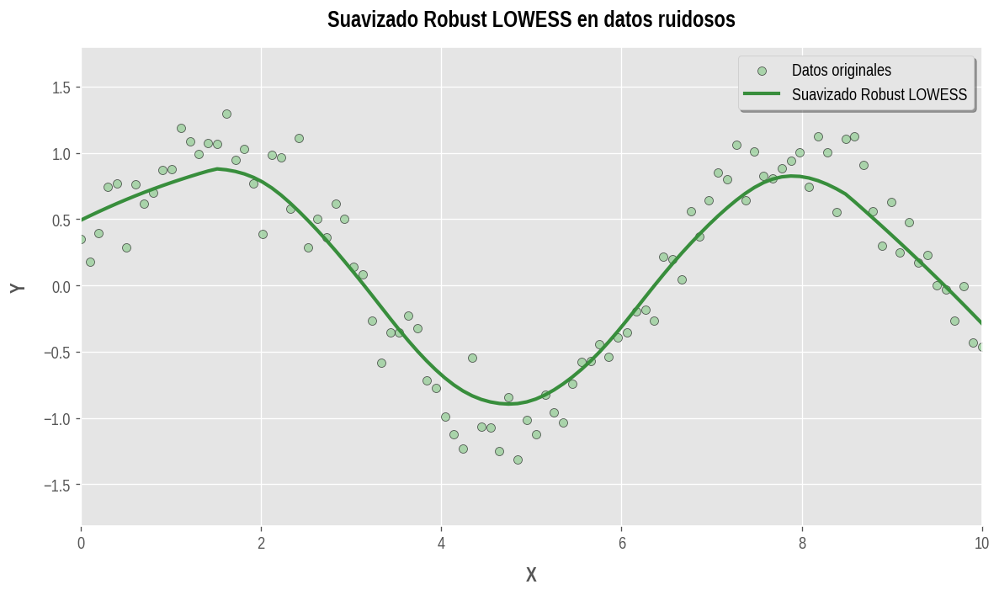

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import linalg

def robust_lowess(x, y, f=2./3., iter=3):
    # Calcula el número de puntos en el conjunto de datos
    n = len(x)

    # Determina el número de vecinos (r) para cada punto basado en el parámetro de suavizado (f)
    r = int(np.ceil(f * n))

    # Calcula la distancia de cada punto a su r-ésimo vecino más cercano para determinar la ventana de suavizado
    h = [np.sort(np.abs(x - x[i]))[r] for i in range(n)]

    # Calcula los pesos iniciales utilizando una función de peso cúbica, con base en las distancias normalizadas
    w = np.clip(1 - (np.abs((x[:, None] - x[None, :]) / h)) ** 3, 0, 1) ** 3

    # Inicializa el vector de valores suavizados en cero
    y_smooth = np.zeros(n)

    # Inicializa los factores de ajuste (delta) en unos, que ayudarán a reducir la influencia de los outliers
    delta = np.ones(n)

    # Itera para realizar el ajuste robusto, reduciendo gradualmente el impacto de los outliers
    for _ in range(iter):
        # Recalcula el ajuste local para cada punto
        for i in range(n):
            # Actualiza los pesos tomando en cuenta el ajuste robusto
            weights = delta * w[:, i]

            # Crea la matriz A para la regresión lineal ponderada
            A = np.array([
                [np.sum(weights), np.sum(weights * x)],
                [np.sum(weights * x), np.sum(weights * x**2)]
            ])

            # Crea el vector b para la regresión lineal ponderada
            b = np.array([np.sum(weights * y), np.sum(weights * y * x)])

            # Resuelve el sistema de ecuaciones A * beta = b para obtener los coeficientes beta
            beta = linalg.solve(A, b)

            # Calcula el valor suavizado en el punto i usando los coeficientes beta
            y_smooth[i] = beta[0] + beta[1] * x[i]

        # Calcula los residuos (diferencia entre y real y y suavizado) después de cada iteración
        residuals = y - y_smooth

        # Estima la desviación usando la mediana de los residuos absolutos para una mayor robustez
        s = np.median(np.abs(residuals))

        # Actualiza los factores de ajuste delta para reducir la influencia de los outliers
        delta = np.clip(residuals / (6.0 * s), -1, 1)
        delta = (1 - delta ** 2) ** 2

    # Devuelve los valores suavizados finales
    return y_smooth

# Datos de ejemplo
np.random.seed(0)
x = np.linspace(0, 10, 100)
y = np.sin(x) + np.random.normal(0, 0.2, 100)

# Aplicar el suavizado robusto
y_smooth = robust_lowess(x, y, f=0.3, iter=3)

# Tamaño de la figura
plt.figure(figsize=(10, 6))

# Datos originales (puntos) en un color más suave
plt.scatter(x, y, color=COLORES[0], alpha=0.6, edgecolor='k', label='Datos originales')

# Curva suavizada con un color más llamativo y línea más gruesa
plt.plot(x, y_smooth, color=COLORES[1], linewidth=2.5, label='Suavizado Robust LOWESS')

# Leyenda mejorada
plt.legend(loc='upper right', fontsize=12, frameon=True, shadow=True, fancybox=True)

# Etiquetas de los ejes con fuente más grande
plt.xlabel("X", fontsize=14, fontweight='bold', labelpad=10)
plt.ylabel("Y", fontsize=14, fontweight='bold', labelpad=10)

# Título del gráfico con estilo profesional
plt.title("Suavizado Robust LOWESS en datos ruidosos", fontsize=16, fontweight='bold', pad=15)

# Límites personalizados para ajustar mejor los datos
plt.xlim(x.min(), x.max())
plt.ylim(y.min() - 0.5, y.max() + 0.5)

# Mostrar gráfico
plt.tight_layout()
plt.show()


###2.	Non Local Means
> Desde un enfoque técnico, el Non-Local Means (NLM) es una técnica de reducción de ruido que se fundamenta en la similitud de patrones dentro de una imagen. A diferencia de los métodos tradicionales, que solo consideran los píxeles vecinos inmediatos, el NLM evalúa la similitud entre un píxel objetivo y otros píxeles en toda la imagen **[9]**. Esto se logra comparando pequeñas áreas (o parches) alrededor del píxel de interés con parches en áreas distantes que presentan similitudes estructurales, como texturas o patrones de grano fino. De este modo, el algoritmo promedia los valores de los píxeles similares, lo que permite preservar detalles importantes mientras se reduce el ruido **[10]**.

> Este método puede ser conceptualizado como una técnica de limpieza de imagen que busca partes que se asemejan. En lugar de suavizar todos los píxeles de manera uniforme, el NLM identifica áreas similares en la imagen y suaviza únicamente aquellas regiones que muestran similitud, ayudando así a mantener los detalles esenciales **[11]**.

> Para implementar el método Non-Local Means, se deben seguir los siguientes pasos:

>> **i.**	 Para cada píxel, se define una ventana de vecindad pequeña (por ejemplo, 3x3) y una ventana de búsqueda más amplia (por ejemplo, 7x7).

>> **ii.**	Se compara la vecindad del píxel objetivo con todas las vecindades en la ventana de búsqueda, lo que implica medir la similitud de los patrones de color en ambas áreas.

>> **iii.**	Se asignan pesos a los píxeles en función de su similitud; aquellos que son más parecidos obtienen mayor peso y se incluyen en el promedio, mientras que los menos similares tienen una influencia reducida.

>> **iv.**	Finalmente, se calcula el valor promedio ponderado de los píxeles seleccionados y se asigna al píxel central, logrando así una reducción del ruido que preserva los detalles importantes.

> La analogía entre imágenes y señales ECG se basa en los patrones repetitivos. Así como en una imagen ciertos detalles (como colores o texturas) se repiten en distintas áreas, en una señal ECG los complejos de ondas también se repiten en cada latido. Esta similitud permite que NLM encuentre patrones comunes y, en lugar de "suavizar" uniformemente la señal, identifica segmentos específicos que comparten las mismas características.

> Como lo mencionan los autores Brian H. Tracey y Eric L. Miller en su estudio “Nonlocal Means Denoising of ECG Signals” **[12]**, el método de Non Local Means, aprovecha la similitud entre patrones repetitivos. En imágenes, los píxeles similares (aunque no estén juntos en el espacio) ayudan a identificar el ruido y eliminarlo sin distorsionar detalles importantes. En el caso de señales de ECG, también hay patrones repetitivos: las ondas correspondientes a cada latido del corazón (complejos P-QRS-T) presentan una estructura característica y repetitiva.

> La idea es extrapolar el concepto de NLM en imágenes a las señales ECG, donde en lugar de comparar píxeles, se comparan "parches" de la señal que contienen estas ondas características. Al encontrar segmentos similares dentro de la señal, el NLM puede atenuar el ruido sin afectar el patrón de las ondas del ECG, en particular el complejo QRS, que es fundamental para el diagnóstico.

> Asimismo, los autores destacan que el complejo QRS es la parte de la señal ECG que representa la actividad eléctrica principal del corazón y tiene una forma de onda bien definida y de alta amplitud. Si se suaviza en exceso, este complejo puede perder su nitidez y sus picos característicos, que son esenciales para detectar ritmos cardíacos y posibles arritmias.

> Además, es necesario tener en cuenta el valor de lambda (𝜆), un parámetro clave en el NLM que controla cuánta similitud se requiere entre parches para decidir si se promedian. Si el valor de 𝜆 es muy bajo, el algoritmo es muy estricto al comparar parches, por lo que parches que podrían ser útiles se consideran disímiles, lo que lleva a un promedio insuficiente y, por ende, a una eliminación de ruido menos efectiva. Si el valor de 𝜆 es muy alto, parches que realmente no son similares entre sí podrían ser considerados iguales, lo cual provoca un "desenfoque" en la señal y pérdida de detalles críticos, como el complejo QRS.

> Finalmente, los autores encontraron que el método NLM logra resultados comparables a los métodos avanzados basados en wavelets en términos de mejora de la relación señal-ruido, al mismo tiempo que reduce hasta tres veces o más las métricas de distorsión en la forma de onda.

> Adicionalmente, otros investigadores mencionan que la NLM es eficaz para eliminar el ruido de baja frecuencia y mantener la morfología general de la señal, no obstante, enfrenta desafíos específicos en la región del complejo QRS de alta frecuencia debido al "efecto de parches raros". Este efecto ocurre cuando los parches de la señal alrededor del complejo QRS son menos comunes o tienen una alta variabilidad, lo que dificulta el cálculo preciso del promedio ponderado en esta región, resultando en un subpromedio que no alcanza a denoising adecuado en estas áreas cruciales **[13]**. Esto es porque la estimación NLM resulta más efectiva cuando las muestras dentro de los parches presentan amplitudes uniformemente distribuidas, como ocurre en las señales de baja frecuencia. Sin embargo, en la región del complejo QRS, las muestras suelen presentar variaciones de amplitud mucho más pronunciadas, lo que puede llevar a errores en la estimación.

> Además, el NLM requiere un alto costo computacional, ya que implica la estimación de cada muestra individual dentro de un vecindario de búsqueda amplio, aumentando el tiempo de procesamiento significativamente **[13]**.



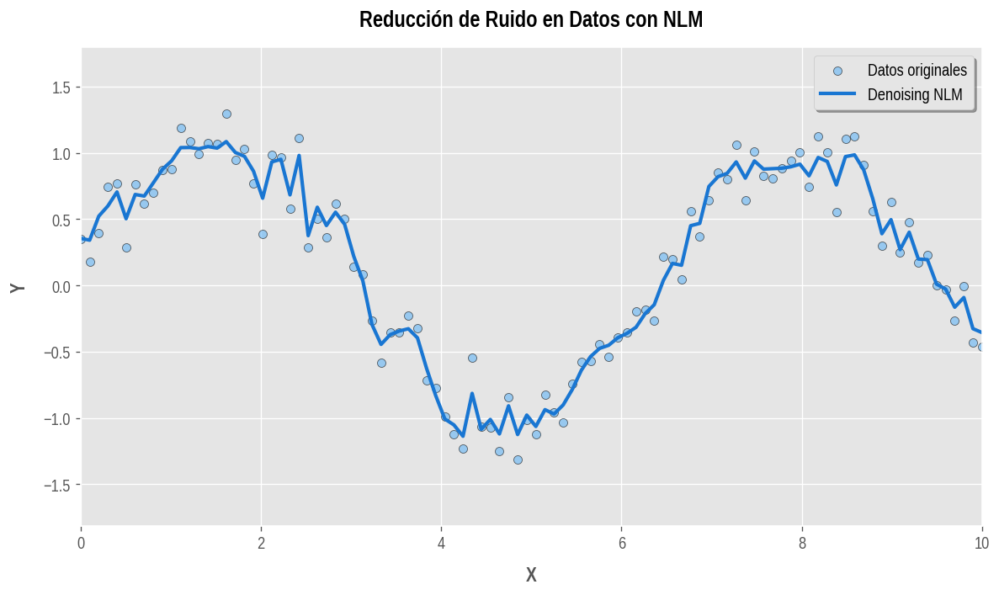

In [4]:
import numpy as np
import matplotlib.pyplot as plt

def nlm_denoising(signal, patch_size=5, search_window=10, h=0.5):
    n = len(signal)
    denoised_signal = np.zeros(n)

    # Ajuste para que el tamaño del parche sea uniforme
    half_patch = patch_size // 2

    for i in range(n):
        weighted_sum = 0.0
        normalizing_factor = 0.0

        # Define rango de búsqueda en los alrededores del punto actual
        start = max(0, i - search_window)
        end = min(n, i + search_window + 1)

        for j in range(start, end):
            # Extrae parches alrededor de los puntos i y j con un tamaño fijo
            patch_i = signal[max(0, i - half_patch):min(n, i + half_patch + 1)]
            patch_j = signal[max(0, j - half_patch):min(n, j + half_patch + 1)]

            # Rellena con ceros si los parches son más cortos que el tamaño deseado
            if len(patch_i) < patch_size:
                patch_i = np.pad(patch_i, (0, patch_size - len(patch_i)), mode='constant')
            if len(patch_j) < patch_size:
                patch_j = np.pad(patch_j, (0, patch_size - len(patch_j)), mode='constant')

            # Calcula la distancia euclidiana entre parches y aplica el kernel Gaussiano
            distance = np.sum((patch_i - patch_j) ** 2)
            weight = np.exp(-distance / (h ** 2))

            # Acumula el valor ponderado y el factor de normalización
            weighted_sum += weight * signal[j]
            normalizing_factor += weight

        # Asigna el valor suavizado al punto actual
        denoised_signal[i] = weighted_sum / normalizing_factor if normalizing_factor > 0 else signal[i]

    return denoised_signal

# Datos de ejemplo
np.random.seed(0)
x = np.linspace(0, 10, 100)
y = np.sin(x) + np.random.normal(0, 0.2, 100)

# Aplicar la eliminación de ruido NLM
y_smooth = nlm_denoising(y)

# Tamaño de la figura
plt.figure(figsize=(10, 6))

# Datos originales (puntos) en un color más suave
plt.scatter(x, y, color=COLORES[4], alpha=0.6, edgecolor='k', label='Datos originales')

# Curva suavizada con un color más llamativo y línea más gruesa
plt.plot(x, y_smooth, color=COLORES[5], linewidth=2.5, label='Denoising NLM')

# Leyenda mejorada
plt.legend(loc='upper right', fontsize=12, frameon=True, shadow=True, fancybox=True)

# Etiquetas de los ejes con fuente más grande
plt.xlabel("X", fontsize=14, fontweight='bold', labelpad=10)
plt.ylabel("Y", fontsize=14, fontweight='bold', labelpad=10)

# Título del gráfico con estilo profesional
plt.title("Reducción de Ruido en Datos con NLM", fontsize=16, fontweight='bold', pad=15)

# Límites personalizados para ajustar mejor los datos
plt.xlim(x.min(), x.max())
plt.ylim(y.min() - 0.5, y.max() + 0.5)

# Mostrar gráfico
plt.tight_layout()
plt.show()


## Segunda parte:

De la base de datos proporcionada por https://figshare.com/collections/ChapmanECG/4560497/1 extraer los registros que correspondan a bradicardia sinusal (SB Sinus Bradycardia) y fibrilación auricular (AFIB Atrial Fibrillation).

Con el siguiente codigo podemos realizar una busqueda en el archivo Diagnostics.xlsx, con el cuál podemos obtener los directorios de los archivos que pertecen a los pacientes de interés.

In [5]:
from google.colab import drive
import pandas as pd
import os

drive.mount('/content/drive') # Montamos el Google Drive para acceder a los datos de este
diagnostics_ruta = '/content/drive/MyDrive/Colab Notebooks/Proyecto3/Diagnostics.xlsx' # Ruta al archivo Excel "Diagnostics"
diagnostics = pd.read_excel(diagnostics_ruta) # Leemos los datos del archivo Excel

# Obtener los valores de la primera y segunda columna
columna1 = diagnostics.iloc[:, 0].tolist()
columna2 = diagnostics.iloc[:, 1].tolist()

# Crear listas de directorios
directoriosSB = []
directoriosAFIB = []

for i in range(len(columna1)):
    if columna2[i] == 'SB':
        directoriosSB.append(columna1[i])
    elif columna2[i] == 'AFIB':
        directoriosAFIB.append(columna1[i])

print(f"Tamaño de la lista directorios SB: {len(directoriosSB)}")
print(f"Tamaño de la lista directorios AFIB: {len(directoriosAFIB)}")

Mounted at /content/drive
Tamaño de la lista directorios SB: 3889
Tamaño de la lista directorios AFIB: 1780


De estos registros los análisis para el presente proyecto deben hacerse en la derivación II.

Tal derivación, corresponde a la segunda columna de los "*.CSV".

A continuación podremos encontrar al menos una gráfica de la información dada por los directorios de SB y AFIB con la información cruda.

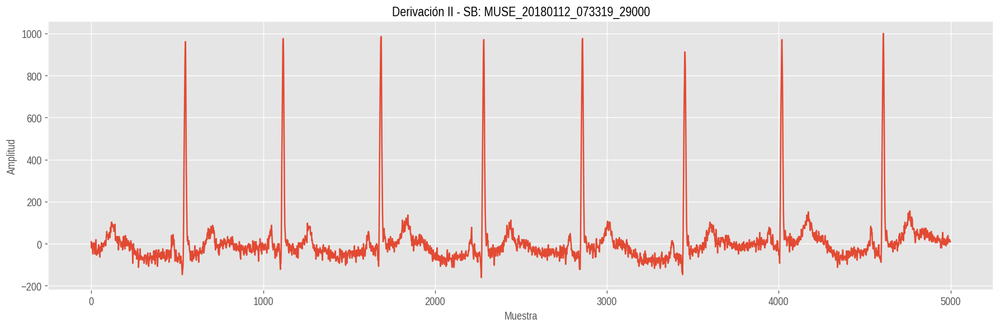

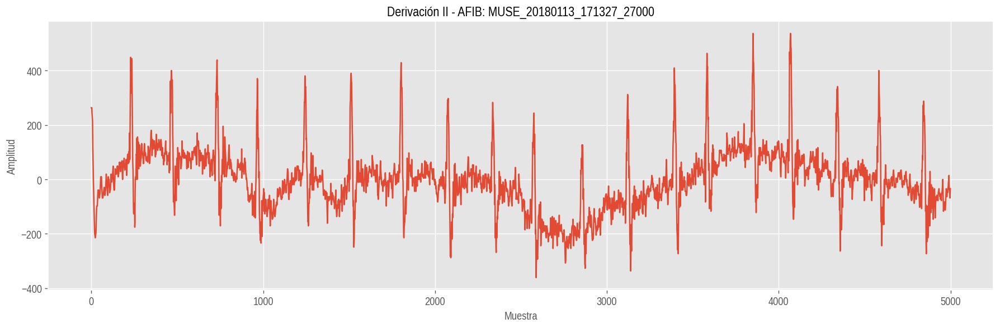

In [6]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Creamos una función para graficar la derivación II
def graficarDerivacion(directorios, tipo):
    for directorio in directorios[:1]:  # Puedes ajustar el número de archivos a observar
        csv_ruta = os.path.join('/content/drive/MyDrive/Colab Notebooks/Proyecto3/ECGData/', directorio + '.csv')  # Construye la ruta al archivo .csv

        try:
            dv = pd.read_csv(csv_ruta)  # Lee el archivo .csv
            senal_original = dv['II'].values  # Extrae la columna 'II' como un array de NumPy
            senal_original = pd.to_numeric(senal_original, errors='coerce')

            # Grafica la columna II
            plt.figure(figsize=(15, 5))
            plt.plot(senal_original)
            plt.title(f'Derivación II - {tipo}: {directorio}')
            plt.xlabel('Muestra')
            plt.ylabel('Amplitud')
            plt.show()

        except FileNotFoundError:
            print(f"Archivo no encontrado: {csv_ruta}")

# Graficar para ambos tipos de datos
graficarDerivacion(directoriosSB, 'SB')
graficarDerivacion(directoriosAFIB, 'AFIB')

## Tercera parte:

Consultar que otros tipos de señales wavelet se pueden usar para el análisis de señales ECG y adaptar el código del filtro wavelet que se entrega en el curso de acuerdo a la consulta.

In [7]:
!pip install PyWavelets
!pip install statsmodels

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 48.7 MB/s eta 0:00:00


#### Tipos de Wavelets

> Las *wavelets* son funciones matemáticas utilizadas para descomponer señales o funciones complejas en componentes más simples para analizar las señales en distintos niveles de detalle y frecuencia. A diferencia de los senos y cosenos de la transformada de Fourier, las wavelets permiten un análisis localizado en el tiempo, ideal para señales no periódicas o de corta duración.

> Existen varias *familias de wavelets*, cada una con propiedades específicas que las hacen adecuadas para distintos tipos de aplicaciones. Entre las principales familias están *[39][40]*:

> 1. **Haar**: Es la wavelet más simple y la primera en desarrollarse. Es discontinua y tiene una forma similar a una función escalonada, lo que la hace adecuada para representar cambios abruptos en las señales.

> 2. **Daubechies**: Estas wavelets son compactas y ortogonales, ideales para análisis discreto. Su nombre se representa como "dbN", donde "N" indica el orden de la wavelet.

> 3. **Biortogonales**: Utilizan dos wavelets diferentes para la descomposición y la reconstrucción de señales, lo que permite una fase lineal y es útil en aplicaciones de procesamiento de imágenes.

> 4. **Coiflets**: Fueron diseñadas para tener buenos momentos nulos, lo que mejora la precisión en la representación de las características de las señales. Son útiles para aplicaciones que requieren alta precisión en el análisis de detalles.

> 5. **Symlets**: Son una modificación simétrica de las wavelets Daubechies y se utilizan para evitar distorsiones en la reconstrucción de señales.

> 6. **Morlet**: Esta wavelet no tiene una función de escalado y es empleada principalmente en análisis de señales en el dominio de frecuencia, especialmente en el análisis de datos no estacionarios.

> 7. **Sombrero Mexicano** (Mexican Hat): Derivada de la segunda derivada de una función gaussiana, se utiliza comúnmente en el procesamiento de imágenes y análisis de datos de contorno.

> 8. **Meyer**: Se define en el dominio de frecuencia y es continua y suave, lo que la hace adecuada para análisis de frecuencia de señales.

> Además de estas, existen **wavelets complejas**, como las de tipo Gaussian, Morlet compleja, B-Spline en frecuencia, y Shannon. Estas wavelets complejas son especialmente valiosas en el análisis de señales en tiempo-frecuencia, ya que proporcionan información de fase y permiten un análisis más detallado de señales no estacionarias.

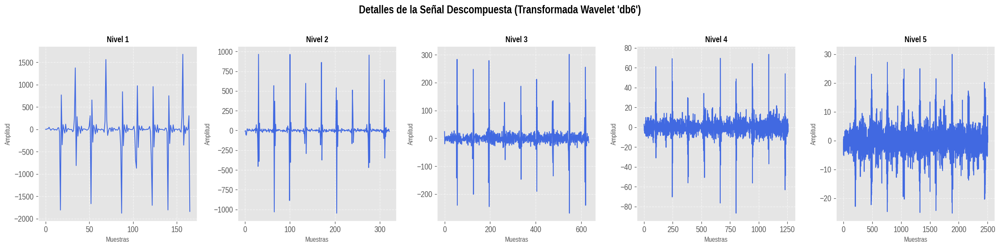

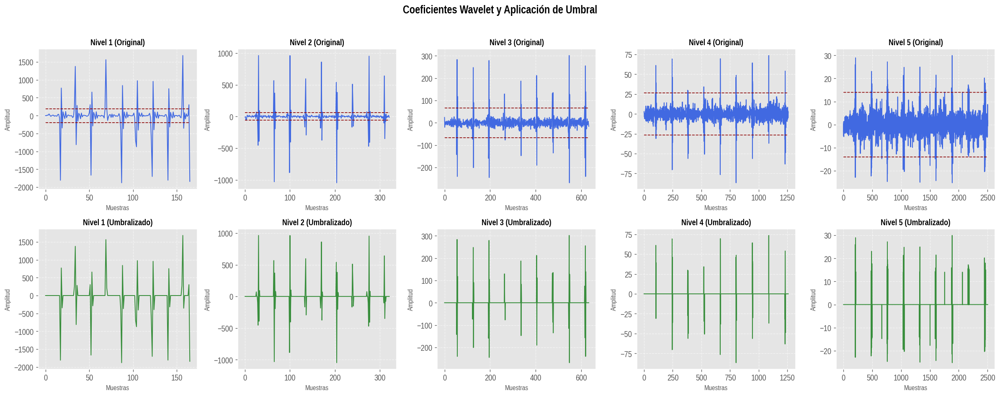

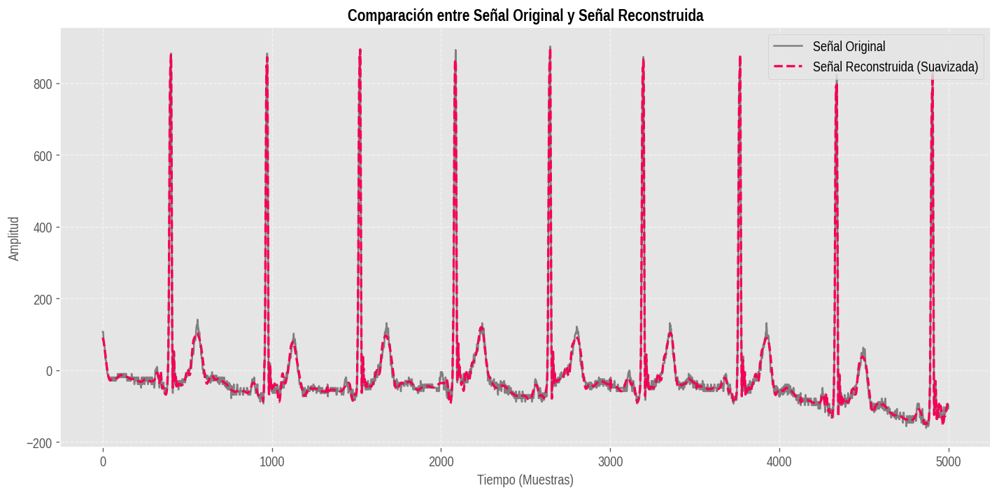

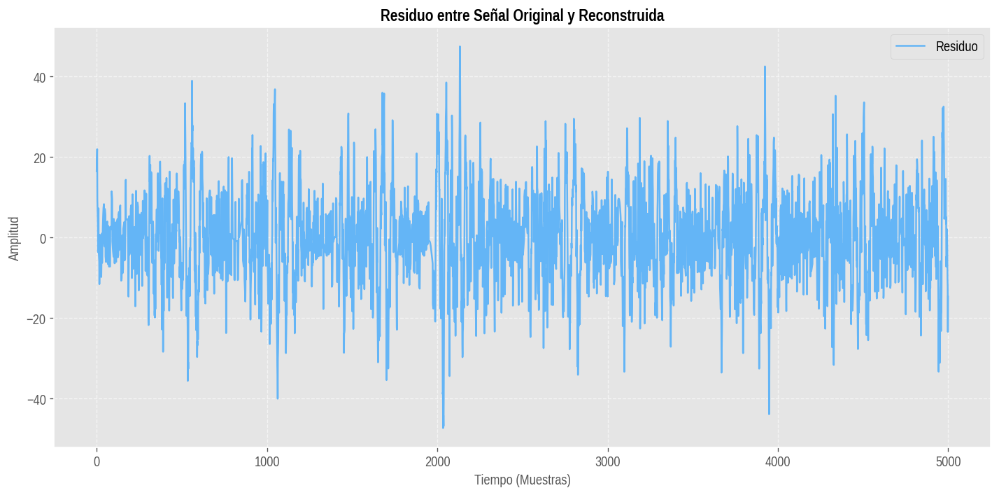

In [8]:
# Importamos las librerías necesarias
import os
import numpy as np
import pandas as pd
import pywt
import matplotlib.pyplot as plt

# Definimos la función para calcular el ruido en los coeficientes wavelet
def wnoisest(coeff):
    stdc = np.zeros((len(coeff), 1))
    for i in range(len(coeff)):
        stdc[i] = (np.median(np.abs(coeff[i]))) / 0.6745
    return stdc

# Definimos la función para calcular el umbral de los coeficientes wavelet
def threshold(coeff):
    Num_samples = sum([c.shape[0] for c in coeff])
    thr = np.sqrt(2 * (np.log(Num_samples)))
    return thr

# Aplicación del umbral a los coeficientes wavelet
def wthresh(coeff):
    y = []
    s = wnoisest(coeff)
    thr = threshold(coeff)
    for i in range(len(coeff)):
        y.append(np.multiply(coeff[i], np.abs(coeff[i]) > (thr * s[i])))
    return thr, s, y

# Carga de los datos de ECG desde un archivo .csv
csv_ruta = os.path.join('/content/drive/MyDrive/Colab Notebooks/Proyecto3/ECGData/', directoriosSB[1] + '.csv')
df = pd.read_csv(csv_ruta)
data = df['II'].values

# Nivel de descomposición para la transformada wavelet
level = 5

# Transformada Wavelet Discreta usando Daubechies 'db6'
data_wavelet = pywt.wavedec(data, 'db6', level=level)

# Visualización de los detalles de la señal con títulos y ejes claros
fig, axes = plt.subplots(nrows=1, ncols=level, figsize=(20, 5))
fig.suptitle("Detalles de la Señal Descompuesta (Transformada Wavelet 'db6')", fontsize=16, fontweight='bold')
for i in range(level):
    axes[i].plot(data_wavelet[i+1], color=COLORES[6], linewidth=1.2)
    axes[i].set_title(f'Nivel {i+1}', fontsize=12, fontweight='bold')
    axes[i].set_xlabel('Muestras', fontsize=10)
    axes[i].set_ylabel('Amplitud', fontsize=10)
    axes[i].grid(True, linestyle='--', alpha=0.6)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Aplicación de umbral a los detalles
thr, s, details_t = wthresh(data_wavelet[1:])

# Visualización de los detalles antes y después de aplicar el umbral
fig, axes = plt.subplots(nrows=2, ncols=level, figsize=(20, 8))
fig.suptitle("Coeficientes Wavelet y Aplicación de Umbral", fontsize=16, fontweight='bold')
for i in range(level):
    # Coeficientes originales
    axes[0, i].plot(data_wavelet[i+1], color=COLORES[6], linewidth=1.2)
    axes[0, i].plot(thr * s[i] * np.ones(len(data_wavelet[i+1])), color='darkred', linestyle='--', linewidth=1)
    axes[0, i].plot(-thr * s[i] * np.ones(len(data_wavelet[i+1])), color='darkred', linestyle='--', linewidth=1)
    axes[0, i].set_title(f'Nivel {i+1} (Original)', fontsize=12, fontweight='bold')
    axes[0, i].set_xlabel('Muestras', fontsize=10)
    axes[0, i].set_ylabel('Amplitud', fontsize=10)
    axes[0, i].grid(True, linestyle='--', alpha=0.6)

    # Coeficientes umbralizados
    axes[1, i].plot(details_t[i], color=COLORES[1], linewidth=1.2)
    axes[1, i].set_title(f'Nivel {i+1} (Umbralizado)', fontsize=12, fontweight='bold')
    axes[1, i].set_xlabel('Muestras', fontsize=10)
    axes[1, i].set_ylabel('Amplitud', fontsize=10)
    axes[1, i].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Reconstrucción de la señal usando los detalles umbralizados
coeff = [data_wavelet[0]] + details_t
x_rec = pywt.waverec(coeff, 'db6')
x_rec = x_rec[:len(data)]

# Visualización de la señal original y la señal reconstruida
plt.figure(figsize=(12, 6))
plt.plot(data, label='Señal Original', color='gray', linewidth=1.5)
plt.plot(x_rec, label='Señal Reconstruida (Suavizada)', color=COLORES[3], linestyle='--', linewidth=2)
plt.xlabel("Tiempo (Muestras)", fontsize=12)
plt.ylabel("Amplitud", fontsize=12)
plt.title("Comparación entre Señal Original y Señal Reconstruida", fontsize=14, fontweight='bold')
plt.legend(loc='upper right', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# Visualización de la señal de diferencia (residuo)
x_filt = np.squeeze(data - x_rec)
plt.figure(figsize=(12, 6))
plt.plot(x_filt, label='Residuo', color=COLORES[4], linewidth=1.5)
plt.xlabel("Tiempo (Muestras)", fontsize=12)
plt.ylabel("Amplitud", fontsize=12)
plt.title("Residuo entre Señal Original y Reconstruida", fontsize=14, fontweight='bold')
plt.legend(loc='upper right', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [9]:
import numpy as np
import pywt

def wnoisest(coeff):
    """ Calcula el ruido en los coeficientes wavelet usando la desviación absoluta de la mediana. """
    stdc = np.zeros((len(coeff), 1))
    for i in range(len(coeff)):
        stdc[i] = (np.median(np.abs(coeff[i]))) / 0.6745
    return stdc

def threshold(coeff):
    """ Calcula el umbral universal basado en el número de muestras. """
    Num_samples = sum([c.shape[0] for c in coeff])
    thr = np.sqrt(2 * (np.log(Num_samples)))
    return thr

def wthresh(coeff):
    """ Aplica el umbral calculado a los coeficientes wavelet para eliminar el ruido. """
    y = []
    s = wnoisest(coeff)
    thr = threshold(coeff)
    for i in range(len(coeff)):
        y.append(np.multiply(coeff[i], np.abs(coeff[i]) > (thr * s[i])))
    return y

def waveletModificado(senal, wavelet='db6', level=5):
    """
    Realiza la descomposición wavelet de una señal, aplica un umbral a los coeficientes para eliminar el ruido,
    y reconstruye la señal filtrada.

    Parámetros:
    - senal: array de la señal de entrada.
    - wavelet: tipo de wavelet para la descomposición.
    - level: nivel de descomposición de la wavelet.

    Retorna:
    - La señal reconstruida (filtrada).
    """
    # Descomposición de la señal usando la Transformada Wavelet Discreta
    data_wavelet = pywt.wavedec(senal, wavelet, level=level)

    # Umbralización de los coeficientes wavelet
    details_t = wthresh(data_wavelet[1:])

    # Reconstrucción de la señal usando los detalles umbralizados
    coeff = [data_wavelet[0]] + details_t
    senal_rec = pywt.waverec(coeff, wavelet)

    # Aseguramos que la señal reconstruida tenga la misma longitud que la original
    return senal_rec[:len(senal)]


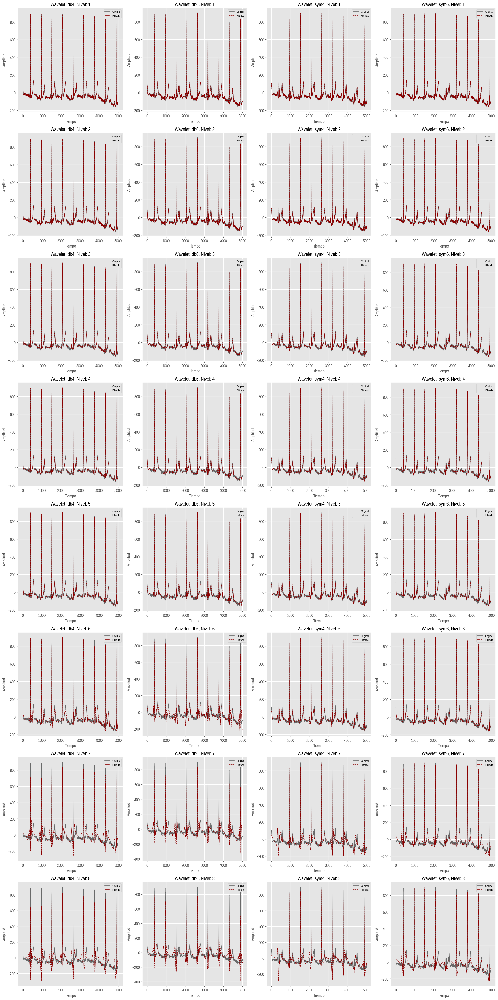

In [10]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Listado de wavelets a probar y niveles de descomposición
wavelets_to_test = ['db4', 'db6', 'sym4', 'sym6']
levels_to_test = range(1, 9)  # Niveles de 1 a 8

# Preparar la figura para los subgráficos (8 filas x 5 columnas)
fig, axes = plt.subplots(nrows= len(levels_to_test), ncols=len(wavelets_to_test), figsize=(20, 40))
plt.subplots_adjust(hspace=0.5, wspace=0.3)

# Cargar los datos de ECG desde un archivo .csv
csv_ruta = os.path.join('/content/drive/MyDrive/Colab Notebooks/Proyecto3/ECGData/', directoriosSB[1] + '.csv')
dv = pd.read_csv(csv_ruta)
data = dv['II'].values

# Recorremos los niveles de 1 a 8 y los wavelets a probar
for i, level in enumerate(levels_to_test):
    for j, wavelet in enumerate(wavelets_to_test):
        # Ejecutar la función `waveletModificado` con cada combinación de wavelet y nivel
        senal_filtrada = waveletModificado(data, wavelet=wavelet, level=level)

        # Graficar el resultado en la cuadrícula
        ax = axes[i, j]
        ax.plot(data, label='Original', color='dimgray', linewidth=1)
        ax.plot(senal_filtrada, label='Filtrada', color='darkred', linestyle='--', linewidth=1)
        ax.set_xlabel("Tiempo")
        ax.set_ylabel("Amplitud")
        ax.set_title(f"Wavelet: {wavelet}, Nivel: {level}")
        ax.legend(loc='upper right', fontsize=8)

# Mostrar la figura con todos los subgráficos
plt.show()


#### Análisis de Wavelet

> De acuerdo con los registros plasmados en la literatura, el filtro Wavelet tipo Daubechies presenta una mayor adaptación y conservación de la señal ECG en comparación del filtro Symlet, preservando significativamente los picos propios de la onda PQRS. Además, a través de las gráficas anteriores es posible dictaminar que el nivel que cuenta con una mayor conservación de los picos bajos como altos y una mitigación significativa del ruido, corresponde al nivel 5, el cual se apega al formato original de la señal sustrayendo un mínimo de información de amplitud.


## Cuarta parte:

Aplicar un flujo de procesamiento que conste de:

### Flujo 1
- Filtro pasa-altas usando filtro IIR a 0.5 Hz. Justificar la elección de parámetros.

- Filtro wavelet modificado del punto 3

- Filtrado pasabajas 50 Hz. Justificar la elección de parámetros y si se usa FIR o IIR

In [11]:
import pywt
from scipy import signal
import math

def Flujo1(senal):
    Fs = 500

    # Filtro Pasa-Altas IIR Butterworth
    orden_iir = 6  # Orden del filtro IIR Butterworth pasa-altas
    wn_hp = 0.5 / (Fs / 2)  # Frecuencia de corte normalizada para pasa-altas
    b_hp, a_hp = signal.iirfilter(orden_iir, wn_hp, btype='high', analog=False, ftype='butter')
    senal_filtrada_f1 = signal.filtfilt(b=b_hp, a=a_hp, x=senal)

    # Filtro wavelet modificado
    senal_filtrada_f1 = waveletModificado(senal_filtrada_f1, level=5, wavelet='db6')

    # Filtro Pasa-Bajas FIR de 50 Hz
    orden_fir = math.floor(3.6 / (30 / Fs))
    wn_lp = 30 / (500 / 2)
    lowpass_fir = signal.firwin(orden_fir + 1, wn_lp, pass_zero='lowpass', window=('kaiser', 6))
    senal_filtrada_f1 = signal.filtfilt(b=lowpass_fir, a=1, x=senal_filtrada_f1)

    return senal_filtrada_f1

### Flujo 2
- Detrend

- Filtro wavelet modificado del punto 3

- Filtrado pasabajas 50 Hz. Justificar la elección de parámetros y si se usa FIR o IIR

In [12]:
import pywt
from scipy import signal
import math

def Flujo2(senal):
    # Detrend (Eliminación de tendencia)
    senal_filtrada_f2 = ajusteDetrend(senal)[0]

    # Filtro wavelet modificado
    senal_filtrada_f2 = waveletModificado(senal_filtrada_f2, level=5, wavelet='db6')

    # Filtro Pasa-Bajas FIR de 50 Hz
    Fs = 500
    wn_lp = 50 / (Fs / 2)  # Frecuencia de corte normalizada para pasa-bajas
    orden_fir = math.floor(3.6 / (50 / 500))
    lowpass_fir = signal.firwin(orden_fir + 1, wn_lp, pass_zero='lowpass', window=('kaiser', 6))
    senal_filtrada_f2 = signal.filtfilt(b=lowpass_fir, a=1, x=senal_filtrada_f2)

    return senal_filtrada_f2

### Flujo 3
- Filtro pasa-altas usando filtro IIR a 0.5 Hz. Justificar la elección de parámetros.
- Filtrado pasabajas 50 Hz. Justificar la elección de parámetros y si se usa FIR o IIR

In [13]:
from scipy import signal
import math

def Flujo3(senal):

    Fs = 500

    # Filtro Pasa-Altas IIR Butterworth
    orden_iir = 6  # Orden del filtro IIR Butterworth pasa-altas
    wn_hp = 0.5 / (Fs / 2)  # Frecuencia de corte normalizada para pasa-altas
    b_hp, a_hp = signal.iirfilter(orden_iir, wn_hp, btype='high', analog=False, ftype='butter')
    senal_filtrada_f3 = signal.filtfilt(b=b_hp, a=a_hp, x=senal)

    # Filtro Pasa-Bajas FIR de 50 Hz
    wn_lp = 50 / (Fs / 2)  # Frecuencia de corte normalizada para pasa-bajas
    orden_fir = math.floor(3.6 / (50 / 500))
    lowpass_fir = signal.firwin(orden_fir + 1, wn_lp, pass_zero='lowpass', window=('kaiser', 6))
    senal_filtrada_f3 = signal.filtfilt(b=lowpass_fir, a=1, x=senal_filtrada_f3)

    return senal_filtrada_f3

Analisis en frecuencia de los filtros montados:

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from matplotlib.gridspec import GridSpec

def mfreqz_bode(b, a, order, nyq_rate=1):
    """
    Plot the frequency response and Bode plot of the filter on a single axis.

    Parameters:
        b: numerator coefficients of the filter transfer function.
        a: denominator coefficients of the filter transfer function.
        order: order of the filter.
        nyq_rate: Nyquist frequency (default is 1).
    """

    # Respuesta en frecuencia (frecuencia normalizada)
    w, h = signal.freqz(b, a)
    freq = w / max(w) * nyq_rate
    mag = np.abs(h)
    h_dB = 20 * np.log10(mag)
    phase = np.unwrap(np.angle(h))  # Desenvuelve la fase para evitar saltos

    # Diagrama de Bode (frecuencia en radianes por segundo)
    w_bode, mag_bode, phase_bode = signal.bode((b, a), w=w * nyq_rate * np.pi)

    # Crear la figura y definir un diseño de cuadrícula
    fig = plt.figure(figsize=(12, 10))
    fig.suptitle(f"Frequency and Bode Response (Order: {order})", fontsize=16)
    gs = GridSpec(3, 3, figure=fig)

    # Subplot 1: Magnitude Response
    ax = [fig.add_subplot(gs[0, i]) for i in range(3)]  # Tres gráficos en la primera fila

    ax[0].plot(freq, mag, color=COLORES[4], label="Magnitude Response")
    ax[0].set_ylabel("Magnitude")
    ax[0].set_xlabel(r"Normalized Frequency (x$\pi$ rad/sample)")
    ax[0].grid(True, which="both", linestyle="--", alpha=0.7)
    ax[0].legend(loc="upper right")

    # Subplot 2: Magnitude in dB
    ax[1].plot(freq, h_dB, color=COLORES[3], linestyle="--", label="Magnitude (dB)")
    ax[1].set_ylabel("Magnitude (dB)")
    ax[1].set_xlabel(r"Normalized Frequency (x$\pi$ rad/sample)")
    ax[1].grid(True, which="both", linestyle="--", alpha=0.7)
    ax[1].legend(loc="upper right")

    # Subplot 3: Phase Response
    ax[2].plot(freq, phase, color="purple", label="Phase Response")
    ax[2].set_ylabel("Phase (radians)")
    ax[2].set_xlabel(r"Normalized Frequency (x$\pi$ rad/sample)")
    ax[2].grid(True, which="both", linestyle="--", alpha=0.7)
    ax[2].legend(loc="upper right")

    # Subplot 4: Bode Magnitude in dB (segunda fila)
    ax.append(fig.add_subplot(gs[1, :3]))  # Primer gráfico en la segunda fila
    ax[3].semilogx(w_bode, mag_bode, color="darkred", label="Bode Magnitude (dB)")
    ax[3].set_ylabel("Magnitude (dB)")
    ax[3].set_xlabel("Frequency (rad/sec)")
    ax[3].grid(True, which="both", linestyle="--", alpha=0.7)
    ax[3].legend(loc="upper right")

    # Subplot 5: Bode Phase in degrees (tercera fila)
    ax.append(fig.add_subplot(gs[2, :3]))  # Segundo gráfico en la tercera fila
    ax[4].semilogx(w_bode, phase_bode, color="green", label="Bode Phase")
    ax[4].set_ylabel("Phase (degrees)")
    ax[4].set_xlabel("Frequency (rad/sec)")
    ax[4].grid(True, which="both", linestyle="--", alpha=0.7)
    ax[4].legend(loc="upper right")

    # Ajustar el diseño y mostrar la figura
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

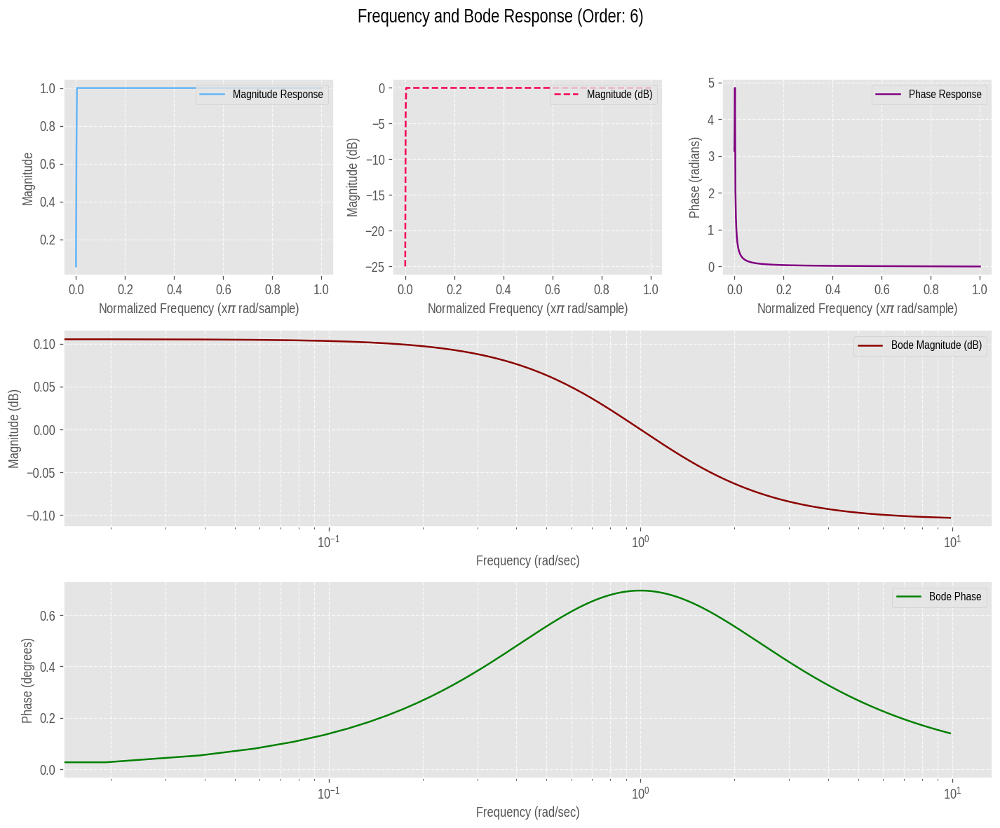

In [15]:
# Filtro Pasa-Altas IIR Butterworth
Fs = 500
orden_iir = 6  # Orden del filtro IIR Butterworth pasa-altas
wn_hp = 0.5 / (Fs / 2)  # Frecuencia de corte normalizada para pasa-altas
b_hp, a_hp = signal.iirfilter(orden_iir, wn_hp, btype='high', analog=False, ftype='butter')

mfreqz_bode(b_hp, a_hp, orden_iir, nyq_rate=1)

#### Análisis de Bode

> En el bode anterior se observa que el filtro IIR de orden 6 presenta una atenuación suave de las frecuencias indeseadas sin evidenciar perturbaciones en la banda pasante, realizando un barrido amplio de frecuencias y una conservación de la fase. Sin embargo, al intentar incrementar el orden se observa una pérdida de selectividad, reduciendo la capacidad del filtro para atenuar las frecuencias indeseadas de la señal, corroborando el hecho de que los filtros tipo IIR trabajan con órdenes más bajos en el área digital.


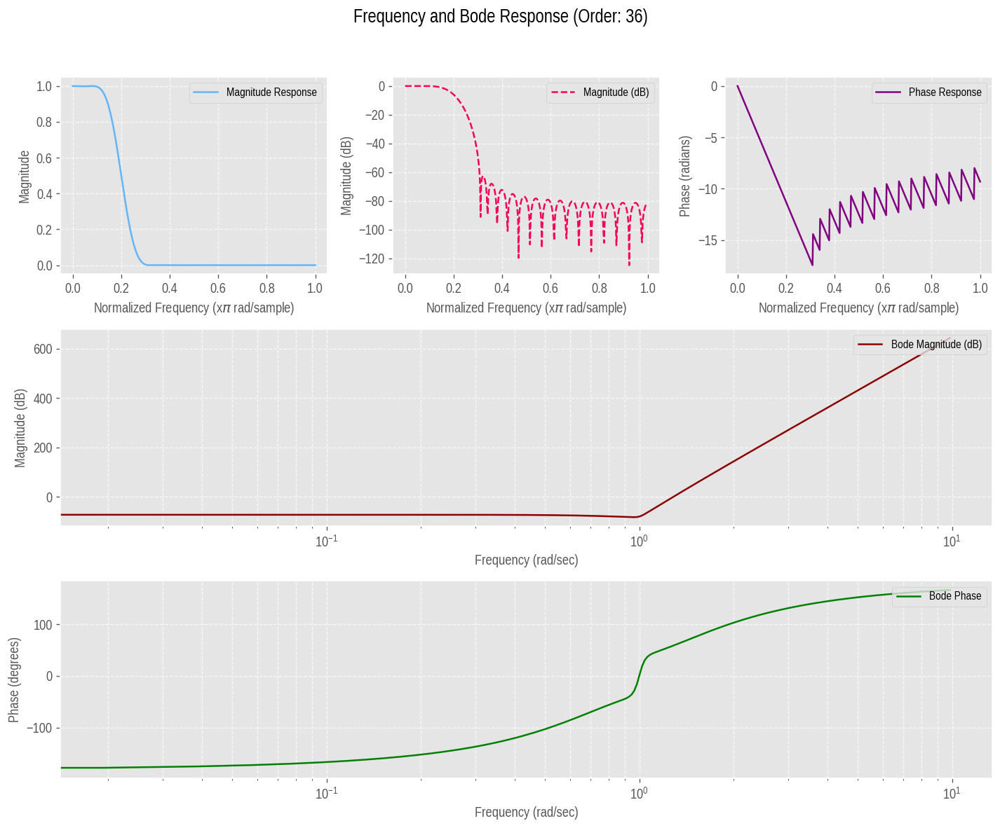

In [16]:
# Filtro Pasa-Bajas FIR de 50 Hz
import math
Fs = 500
wn_lp = 50 / (Fs / 2)  # Frecuencia de corte normalizada para pasa-bajas
orden_fir = math.floor(3.6 / (50 / 500))
lowpass_fir = signal.firwin(orden_fir + 1, wn_lp, pass_zero='lowpass', window=('kaiser', 6))

mfreqz_bode(lowpass_fir, 1, orden_fir, nyq_rate=1)

#### Análisis de Bode

> El filtro FIR presenta una caída brusca de atenuación, siendo altamente selectivo, comportamiento que es propio de los filtros de orden elevado, además de este hecho, se aprecian oscilaciones en la banda de rechazo, las cuales son conocidas como ripples, estas pueden ser generadas por el diseño específico del filtro que debido a su alto orden no puede alcanzar una atenuación suave de su respectiva banda de rechazo, siendo necesario la adición de otros métodos de suavizado **[33]**.

> Por otro lado, en la fase es posible percibir un leve retardo de la señal como consecuencia de los altos órdenes empleados, además se aprecia una fase no lineal en frecuencias elevadas que indican distorsión de la forma de la señal.
Es importante tener en cuenta que estas resonancias indeseadas pueden conllevar a fallas de filtrado de los datos cuyas componentes frecuenciales se encuentren incluidas en esos rangos de distorsión. Finalmente se indica que el orden de 36 además de encontrar respaldo literario implica un menor gasto computacional en el procesamiento de señales ECG.


Ejemplo:

Procesamiento de directorio SB:


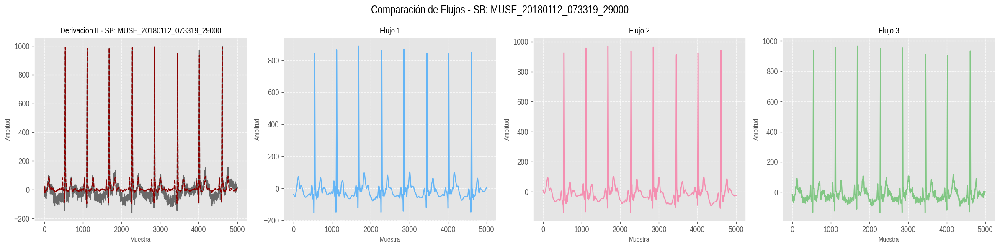

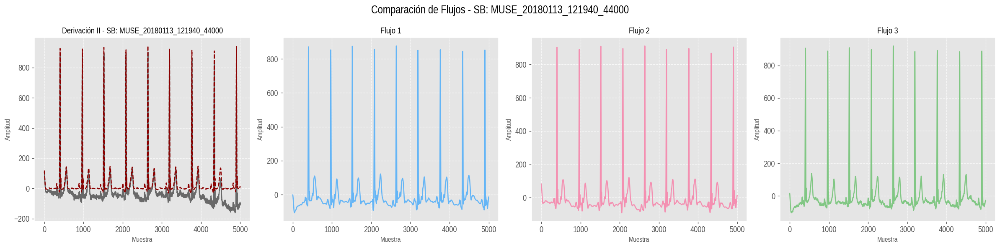

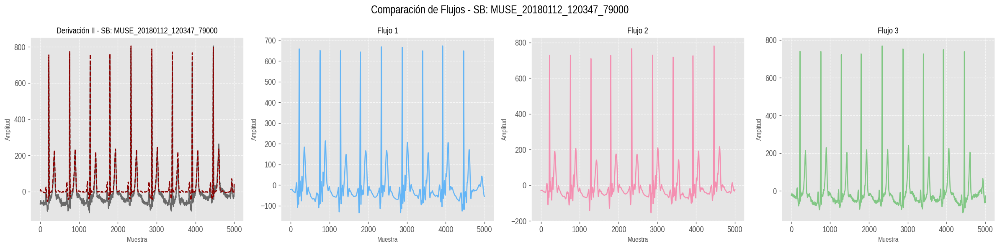

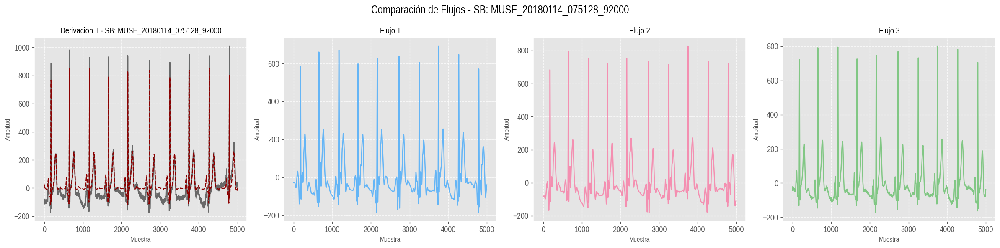

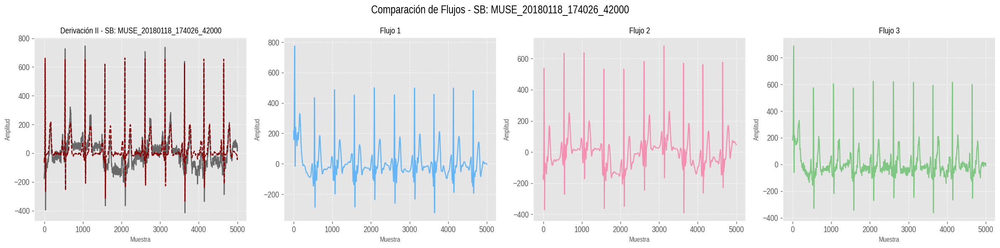

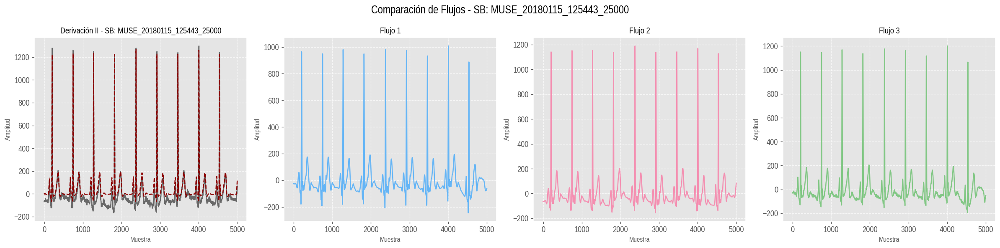

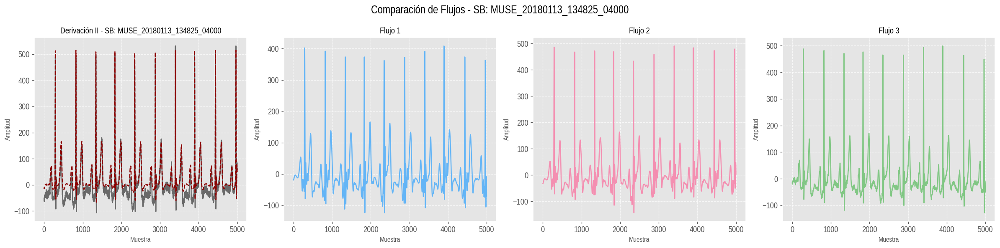

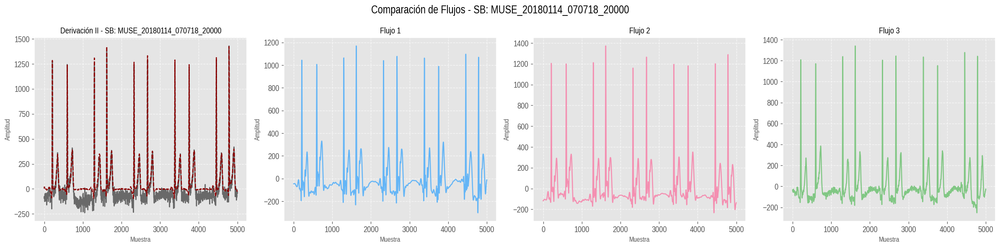

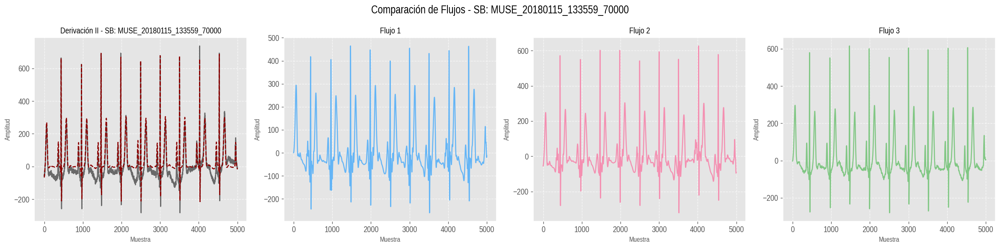

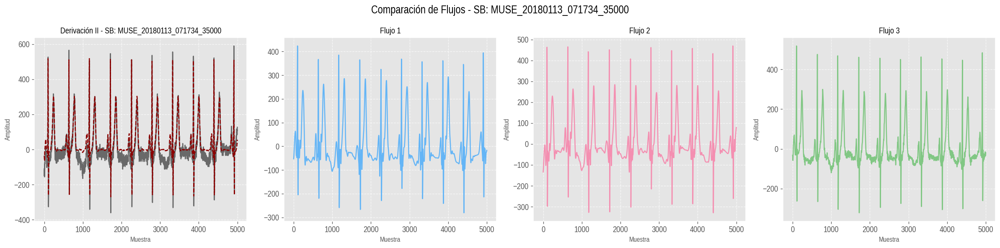

Procesamiento de directorio AFIB:


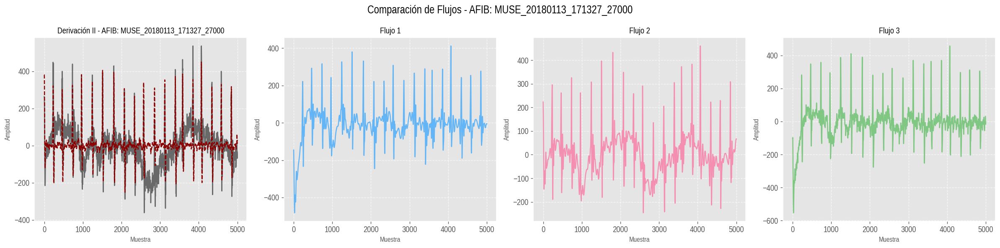

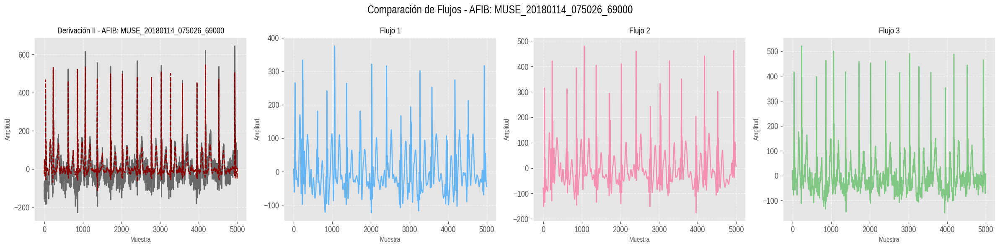

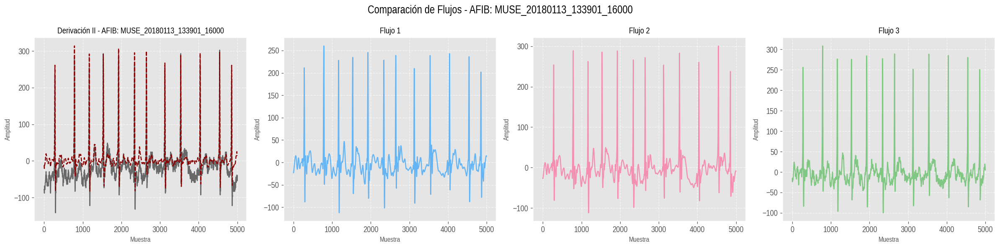

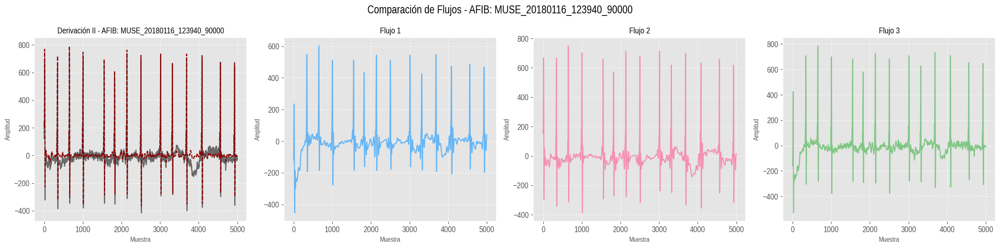

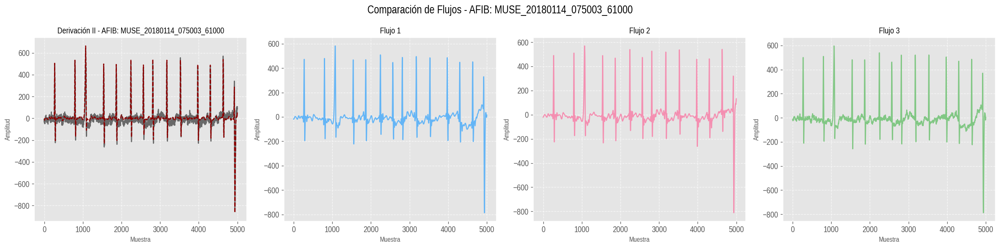

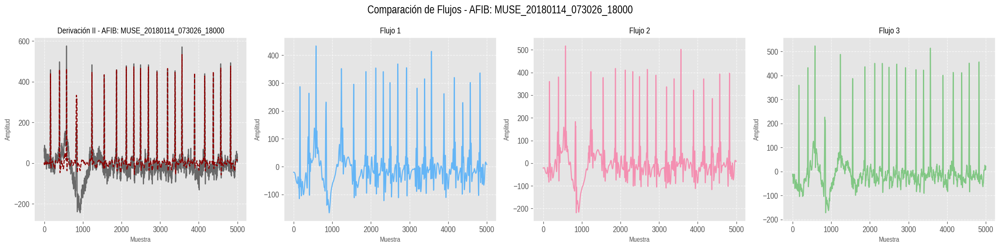

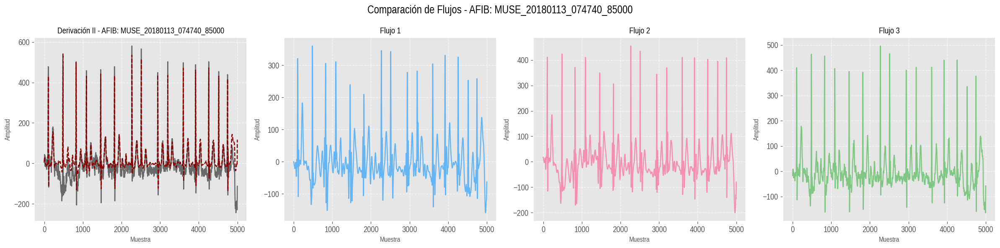

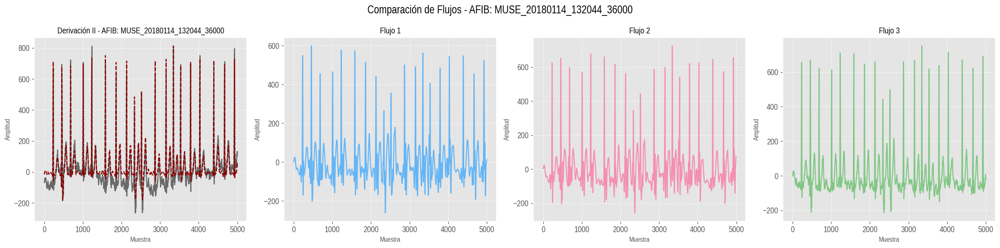

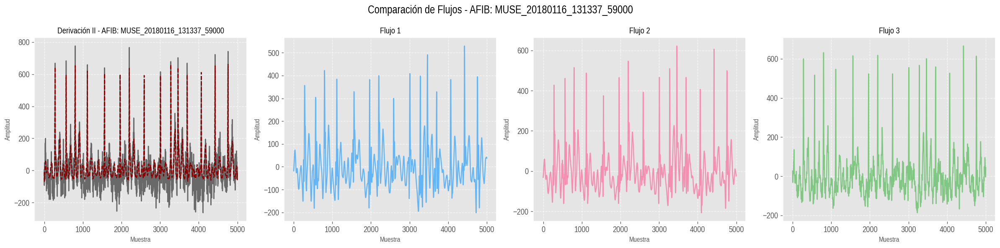

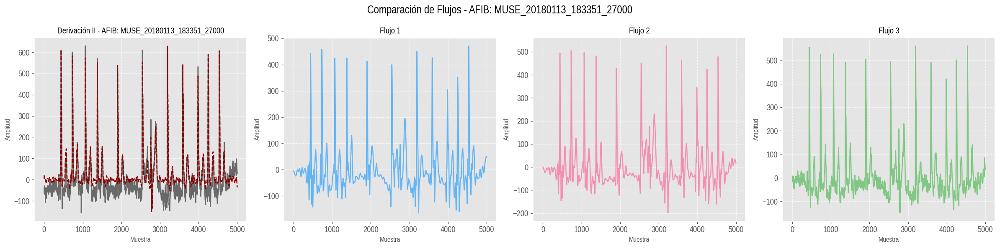

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import linalg
from google.colab import drive
import pandas as pd
import os
import pywt
from statsmodels.robust import mad
from scipy import signal
import math

# Función de procesamiento y graficado
def procesarYGraficar(directorios, tipo):
    for directorio in directorios[:10]:  # Puedes ajustar el número de archivos a observar
        csv_ruta = os.path.join('/content/drive/MyDrive/Colab Notebooks/Proyecto3/ECGData/', directorio + '.csv')
        csv_ruta_2 = os.path.join('/content/drive/MyDrive/Colab Notebooks/Proyecto3/ECGDataDenoised/', directorio + '.csv')

        try:
            df = pd.read_csv(csv_ruta)
            df2 = pd.read_csv(csv_ruta_2, header=None, names=['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6'])
            senal_original = df['II'].values
            senal_denoised = df2['II'].values

            # Asegurar que la señal no sea de tipo string u object
            senal_original = pd.to_numeric(senal_original, errors='coerce')

            # Aplicar los flujos
            senal_flujo1 = Flujo1(senal_original)
            senal_flujo2 = Flujo2(senal_original)
            senal_flujo3 = Flujo3(senal_original)

            # Igualar la longitud de las señales
            min_len = min(len(senal_original), len(senal_flujo1), len(senal_flujo2), len(senal_flujo3))
            senal_original = senal_original[:min_len]
            senal_flujo1 = senal_flujo1[:min_len]
            senal_flujo2 = senal_flujo2[:min_len]
            senal_flujo3 = senal_flujo3[:min_len]

            # Graficar los resultados
            fig, axes = plt.subplots(1, 4, figsize=(20, 5))  # 1 fila, 4 columnas

            # Original signal plot
            axes[0].plot(senal_original, color='dimgray', linewidth=1.5)
            axes[0].set_title(f'Derivación II - {tipo}: {directorio} - Original', fontsize=12)
            axes[0].set_ylabel('Amplitud', fontsize=10)
            axes[0].set_xlabel('Muestra', fontsize=10)
            axes[0].grid(True, linestyle='--', alpha=0.7)

            # Flujo 1 plot
            axes[1].plot(senal_flujo1, color=COLORES[4], linewidth=1.5)
            axes[1].set_title('Flujo 1', fontsize=12)
            axes[1].set_ylabel('Amplitud', fontsize=10)
            axes[1].set_xlabel('Muestra', fontsize=10)
            axes[1].grid(True, linestyle='--', alpha=0.7)

            # Flujo 2 plot
            axes[2].plot(senal_flujo2, color=COLORES[2], linewidth=1.5)
            axes[2].set_title('Flujo 2', fontsize=12)
            axes[2].set_ylabel('Amplitud', fontsize=10)
            axes[2].set_xlabel('Muestra', fontsize=10)
            axes[2].grid(True, linestyle='--', alpha=0.7)

            # Flujo 3 plot
            axes[3].plot(senal_flujo3, color=COLORES[0], linewidth=1.5)
            axes[3].set_title('Flujo 3', fontsize=12)
            axes[3].set_ylabel('Amplitud', fontsize=10)
            axes[3].set_xlabel('Muestra', fontsize=10)
            axes[3].grid(True, linestyle='--', alpha=0.7)

            # Señal denoised
            axes[0].plot(senal_denoised, color='darkred', linewidth=1.5, linestyle='--')
            axes[0].set_title(f'Derivación II - {tipo}: {directorio}', fontsize=12)
            axes[0].set_ylabel('Amplitud', fontsize=10)
            axes[0].set_xlabel('Muestra', fontsize=10)
            axes[0].grid(True, linestyle='--', alpha=0.7)

            # Mejorar el diseño
            plt.tight_layout()
            plt.subplots_adjust(top=0.85)  # Espaciado superior para título general

            # Título general
            fig.suptitle(f'Comparación de Flujos - {tipo}: {directorio}', fontsize=16)

            # Mostrar la gráfica
            plt.show()

        except FileNotFoundError:
            print(f"Archivo no encontrado: {csv_ruta}")

# Procesar y graficar para SB
print('Procesamiento de directorio SB:')
procesarYGraficar(directoriosSB, 'SB')

# Procesar y graficar para AFIB
print('Procesamiento de directorio AFIB:')
procesarYGraficar(directoriosAFIB, 'AFIB')


## Justificación de parámetros




#### Filtro pasa-altas usando filtro IIR a 0.5 Hz.
> Un filtro digital IIR (Respuesta Infinita al Impulso) depende de una serie de muestras de entrada y también de salidas anteriores (retroalimentación de sus propios resultados pasados),siendo llamados filtros recursivos,  los cuales, se caracterizan por necesitar memoria para lograr una especificación similar a la de un filtro FIR y un procesamiento de señal rápido. No obstante, este tipo de filtros son más inestables en comparación de los filtros con respuesta finita al impulso debido a que la retroalimentación puede generar problemas si los coeficientes no se calculan correctamente. Esta estabilidad depende de que todos los polos de la función de transferencia estén dentro del círculo unitario en el plano-z. Si no se cumple esta condición, el filtro puede volverse inestable **[15, 16]**.

> Según lo propuesto por los autores Dewa Gede et. Al **[17]** y Divya Singh et. Al **[18]** en sus artículos, la topología Butterworth, además de destacar en la supresión de ruido por su alto valor de relación señal-ruido (SNR) y bajo error relativo porcentual de distorsión (PRD), asegura una señal ECG que se preserva de forma natural sin alteraciones en su amplitud dentro del rango de frecuencias de interés. Asimismo, los autores Andrey Ivashko y Viktoriia Krylova señalan que un filtro Butterworth de orden 6 es capaz de proveer resultados aceptables sin implicar alteraciones abruptas de la banda de paso o carencias en la atenuación de frecuencias indeseadas **[38]**.

> Por otro lado, diversos estudios **[20, 21, 22]** encontraron que los filtros Chebyshev, en particular el tipo I y orden 2, destacan por alcanzar valores altos de SNR (Alta relación señal-ruido) incluso a órdenes bajos, lo que permite una reducción efectiva del ruido presente en las señales ECG.

#### Filtro Wavelet modificado, Wavelet Daubechies.
> El artículo Optimal Multi-Stage Arrhythmia Classification Approach **[23]** se menciona el desarrollo de un modelo de clasificación para cuatro clases de arritmias: fibrilación auricular, taquicardia supraventricular general, bradicardia sinusal y ritmo sinusal, incluyendo ritmo irregular sinusal. En este, después de obtener la señal ECG del paciente, se procedió a la identificación de diferencias de alturas, anchos y prominencias en relación con el tiempo para identificar las características únicas de señal. Con esta información, los autores construyeron un algoritmo de aprendizaje automático para la clasificación y regresión de la señal ECG. Con este contexto, se optó por buscar un artículo similar que hiciera uso de Wavelets para la detección de arritmias y arrojara un buen resultado.

> Las ondas wavelet son herramientas matemáticas que permiten analizar señales en diferentes escalas, tanto en el tiempo como en la frecuencia. Esto significa que una wavelet  puede dividir una señal en sus componentes de baja y alta frecuencia, ayudando a identificar características específicas de la señal, como transiciones bruscas o anomalías, para nuestro caso, arritmias.

> Las wavelet Daubechies son un tipo de onda wavelet caracterizadas por su "soporte compacto" y su alta precisión para representar funciones complejas **[24]**. Tienen la particularidad de ser capaces de captar comportamientos polinomiales complejos en una señal, gracias a una propiedad llamada "momentos de anulación" **[24]**. Cada onda Daubechies se identifica por un número, como db2, db4 o db10, que representa la cantidad de estos momentos de anulación; a mayor número, mayor suavidad y capacidad de captura de detalles **[25]**.

> Básicamente, las wavelet Daubechies descomponen la señal en diferentes niveles de frecuencia y tiempo mediante transformaciones de escalamiento y desplazamiento (permite observar la señal en distintas resoluciones). Esta estructura permite un análisis multiresolución de la señal, que es esencial para trabajar con señales complejas como el ECG o EEG **[26]**, ya que permite identificar detalles en distintas frecuencias de manera simultánea.

> La capacidad de las wavelets para realizar análisis en tiempo y frecuencia permite detectar patrones específicos en las señales ECG, facilitando la identificación de arritmias y otros problemas cardíacos **[27]**.

> Acorde con la literatura, se encontraron los siguientes artículos que sustentan el Wavelet Daubechies como una buena opción para el procesamiento de señales ECG:

>> - **The Effects of Daubechies Wavelet Basis Function (DWBF) and Decomposition Level on the Performance of Artificial Intelligence-Based Atrial Fibrillation (AF) Detection Based on Electrocardiogram (ECG) Signals [28]** → Este estudio examina el impacto de diferentes funciones de base de wavelets Daubechies (DWBF) y niveles de descomposición en la detección de fibrilación auricular (AF) a partir de señales de ECG. Se utilizaron 10 funciones de base Daubechies (DB1 a DB10) y niveles de descomposición de 1 a 10. Se encontró que el mejor rendimiento se obtenía con el wavelet DB2 en el nivel de descomposición 4 (DB2DL4), con una precisión del 94.17%, mientras que la sensibilidad y especificidad más altas se obtuvieron con DB6 en el nivel 2 (DB6DL2) y DB2 en el nivel 4, respectivamente.
Los autores concluyen que el DB2 con un nivel de descomposición de 4 es particularmente efectivo en términos de precisión para la detección de AF, y recomiendan una selección cuidadosa del nivel de descomposición para lograr un rendimiento óptimo.

>> - **Feature Extraction on Multi-Channel ECG Signals using Daubechies Wavelet Algorithm [29]** → Este trabajo propone la extracción de características de señales ECG multicanal usando la Transformada Wavelet Discreta (DWT) con wavelets Daubechies para mejorar la precisión en la detección de AF.
Se empleó Daubechies 2 (DB2) en el nivel de descomposición 6, que mostró el mejor rendimiento en detección de AF.Los resultados de rendimiento fueron: precisión del 93.83%, sensibilidad del 96.77%, especificidad del 88.64%, F1-score de 95.24%, y precisión del 93.75%.
DB2, en particular, resultó eficaz para la detección de AF cuando se utiliza en un nivel de descomposición más alto (nivel 6). Los autores indican que el uso de wavelets Daubechies permite extraer características de ECG que mejoran la precisión en la detección de irregularidades cardíacas como la fibrilación auricular.

>> - **Daubechies algorithm for highly accurate ECG feature extraction [30]** → Este estudio desarrolla un sistema de extracción de características de ECG basado en la transformada wavelet de multirresolución (MRA), específicamente usando wavelets Daubechies para extraer características precisas y detalladas del ECG.
El wavelet Daubechies de orden 6 (DB6) fue el elegido debido a su similitud con las señales de ECG.
El análisis se realizó hasta un nivel de descomposición 8 para obtener coeficientes de detalles y aproximación que ayudaran a identificar diferentes componentes de la señal ECG, como picos R, Q y S.
Los autores concluyen que los wavelets Daubechies son muy efectivos para el análisis de señales de ECG debido a su similitud estructural y capacidad de descomposición en múltiples niveles de resolución, lo que permite extraer detalles minuciosos de la señal.
El uso de wavelets Daubechies y un banco de filtros permite una reconstrucción perfecta de la señal, con un alto grado de precisión (99.66% en ciertos segmentos de ECG). Esto respalda la utilidad de DB6 en la extracción de características para el diagnóstico de enfermedades cardíacas.


#### Filtro pasa bajas de 50 Hz FIR.
> Dentro de la literatura consultada **[31 – 37]** se encontró que el filtro FIR se presenta como la mejor opción para filtrar la señal ECG a 50 Hz ya que, presenta una mayor estabilidad y valor de SNR documentado (7.71 vs 2.62/5.4995) **[32]**, posee una fase lineal que ayuda a preservar la morfología de la señal ECG además de una menor distorsión de la forma de onda original.

> Más detalladamente, se tiene que:

>> - Art.1: Destaca las ventajas del filtro FIR, como su estabilidad, naturaleza no recursiva y respuesta de fase lineal.

>> - Art.2: Muestra que el filtro FIR Equiripple tiene un mejor índice de relación señal-ruido (SNR) en comparación con el filtro IIR Elíptico, lo que sugiere que el FIR es más eficaz en la eliminación de ruido en la señal ECG.

>> - Art.3:  Respalda el uso de filtros FIR al demostrar que estos son efectivos para eliminar interferencias de línea de potencia y otros ruidos.

>> - Art.4: Los filtros IIR pueden superar a los FIR en ciertos contextos de ruido, pero menciona también que los filtros IIR tienen dificultades para suprimir ruidos que se encuentran en frecuencias similares a la del ECG.

>> - Art.5: Señala que los filtros FIR ofrecen mejor rendimiento en el procesamiento de señales ECG en condiciones de ruido típicas.

>> - Art.6: Refuerza la idea de que el filtro FIR, especialmente con técnicas de ventana como la de Kaiser, es efectivo para eliminar artefactos de la señal ECG.

>> - Art.7: Concluye que el filtro FIR con ventana Kaiser muestra un rendimiento superior en comparación con los filtros IIR, tanto en la reducción de ruido como en la preservación de la forma de onda.


## Flujo seleccionado

> Se han evaluado los resultados obtenidos mediante tres flujos de procesamiento disponibles: flujo 1, flujo 2 y flujo 3. Tras un análisis comparativo de los resultados, se ha decidido continuar con el procesamiento de señales utilizando el **flujo 2** esto debido a las siguientes características

> - *Eliminación de la tendencia lineal (detrend):* este proceso se realiza con el fin de eliminar el ruido de baja frecuencia que altera a la señal ECG,  y  afecta la visualización de la onda PQRS, permitiendo obtener una señal más limpia, sin curvaturas u offsets marcados.

> - *Filtro Wavelet:* el filtro wavelet tipo Daubechies presenta altas similitudes con la señal fisiológica ECG siendo eficaz para suprimir el ruido y conservar las características propias de este tipo de señal al descomponerla en diferentes niveles frecuenciales, siendo rápida, reversible y sin efectos de borde.

> - *Filtro FIR:* la utilización de un filtro FIR con ventana Kaiser facilita la detección y eliminación de interferencias específicas de la señal, como lo pueden ser los ruidos generados por movimiento, esto sin afectar considerablemente las características propias de la señal ECG.

> - *Comportamiento gráfico:* por medio de las gráficas resultantes con las 10 señales de prueba, se identifica que el flujo 2 cuenta con una mayor conservación del comportamiento de la señal original, presentando menores decrementos de amplitud y una adecuada eliminación del ruido en comparación de los flujos N°1 y N°3 los cuales cuentan con transitorios y offset más abruptos en el inicio del filtrado. Sin embargo, es importante destacar la gran sensibilidad al ruido que aún contienen los tres procedimientos retratados, llegando a replicar ciertas interferencias de alta magnitud.

> A continuación, se procederá a procesar las señales de la base de datos ECGData.zip, específicamente aquellas de la derivación II, utilizando el flujo seleccionado. El objetivo es llevar las señales al mismo punto de filtrado alcanzado en el Proyecto 2, es decir, obtener señales filtradas con las características deseadas.

Una vez obtenidas las señales filtradas, se aplicará el procedimiento de normalización utilizado previamente en el Proyecto 2, asegurando así la consistencia de los datos para el análisis y procesamiento posterior en el desarrollo del proyecto actual.

Para realizar el procedimiento de normalización:

Detendencia:

In [18]:
import numpy as np

def ajusteDetrend(datos, grado=4):
  coeficientes = np.polyfit(range(len(datos)), datos, grado)
  valores_ajustados = np.polyval(coeficientes, range(len(datos)))

  datos_detrendeados = datos - valores_ajustados # Datos detrendeados por ajuste
  desviacion = (1/len(datos)) * np.sum((datos - valores_ajustados) ** 2) # Formula (1) del articulo equivalente a la desviación

  return datos_detrendeados, desviacion

Compresión:

In [19]:
import numpy as np

def compresion(datos):

    # Encontrando valores máximos y mínimos
    x_min = np.min(datos)
    x_max = np.max(datos)

    # Evitamos la divición por 0
    if x_min == x_max:
        raise ValueError("Los datos solo tienen un unico valor. No es posible hacer la compresión.")

    datos_comprimidos = (datos - x_min) / (x_max - x_min) # Ecuación (2) del articulo equivalente a la compresión de datos

    return datos_comprimidos

Normalizacion:

Procesamiento de directorio SB:


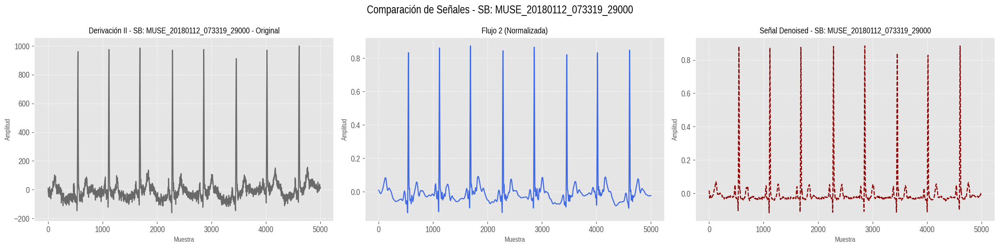

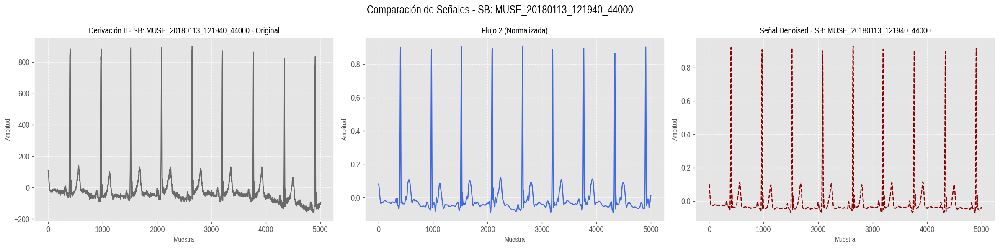

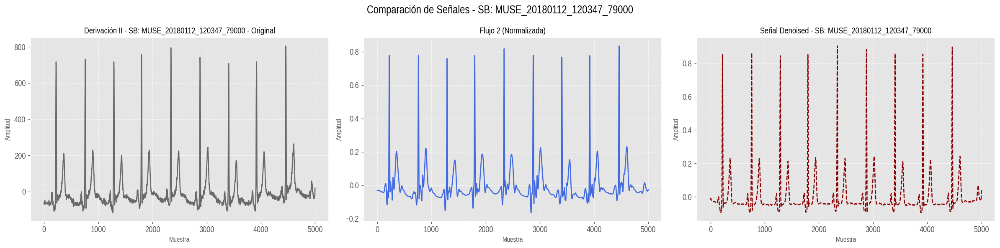

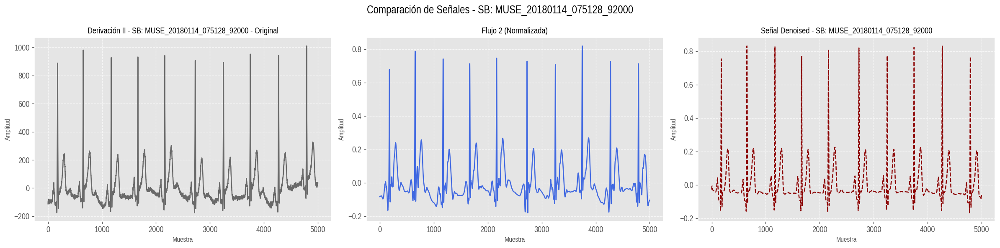

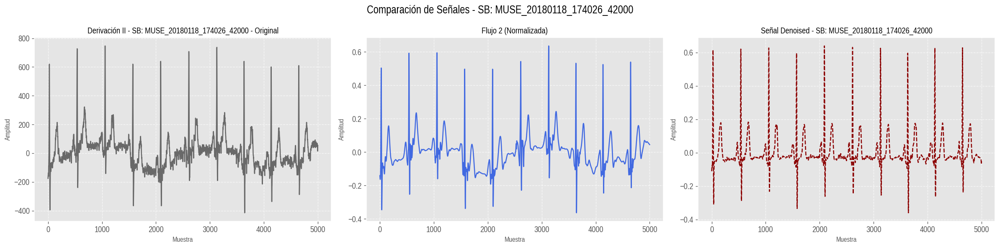

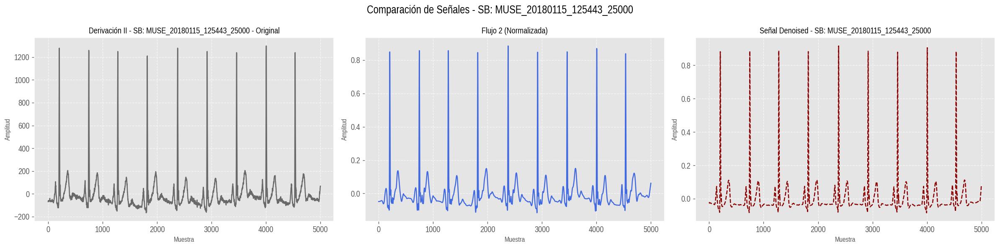

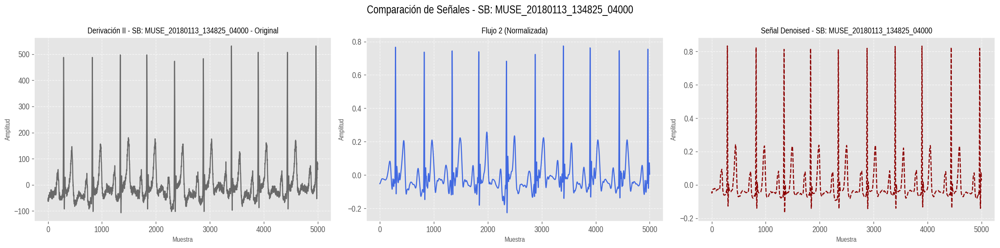

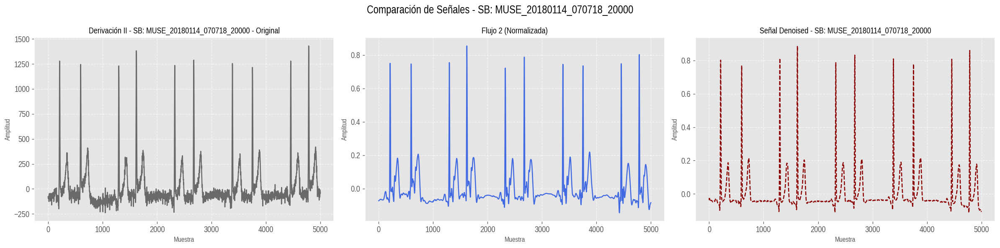

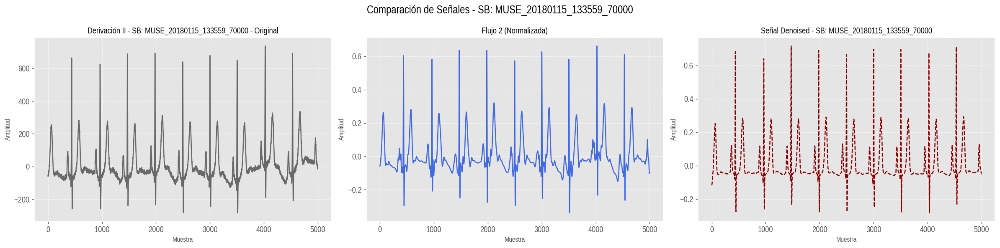

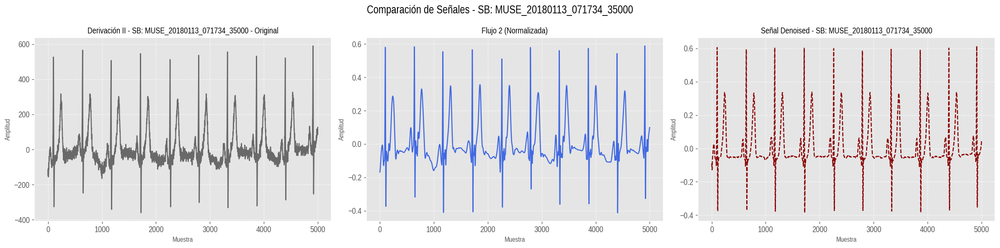

Procesamiento de directorio AFIB:


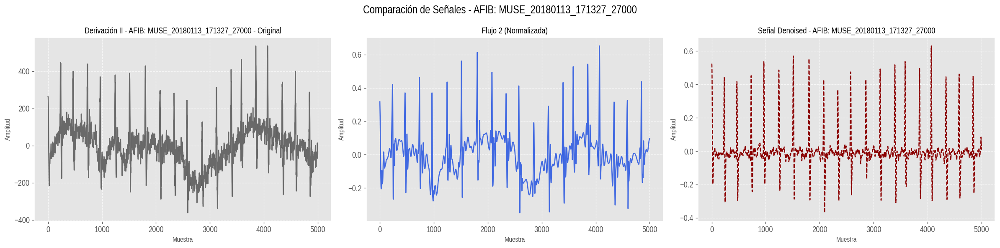

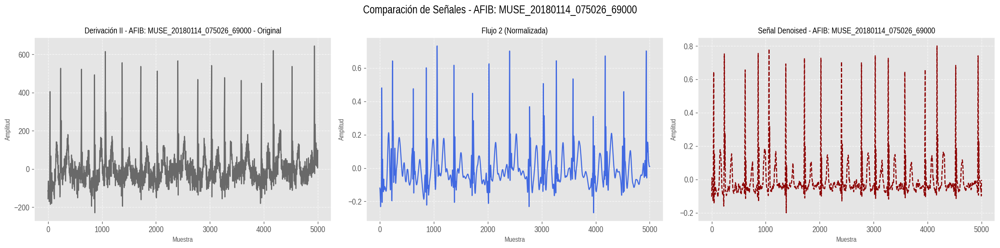

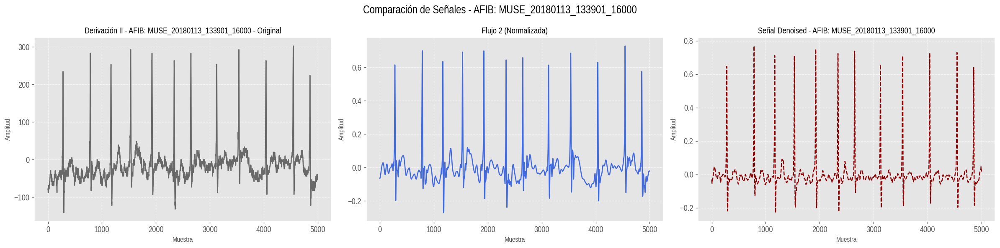

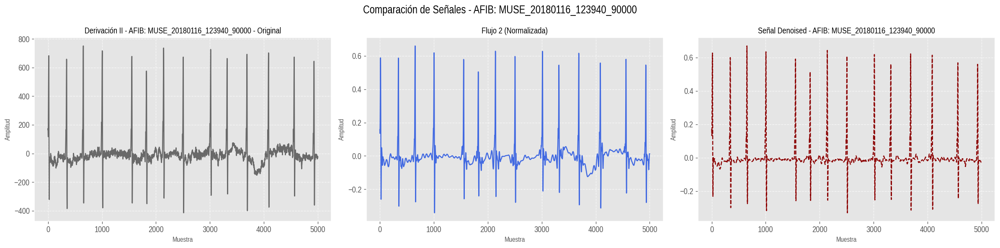

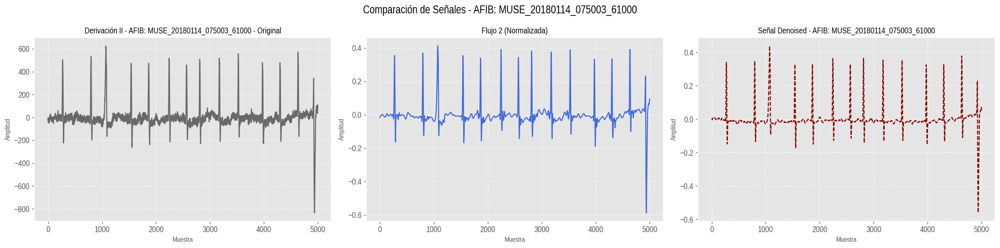

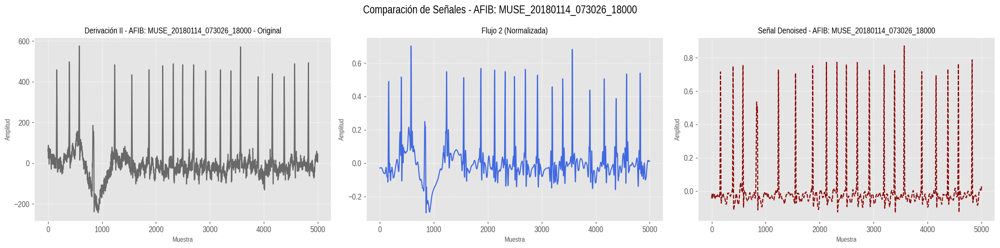

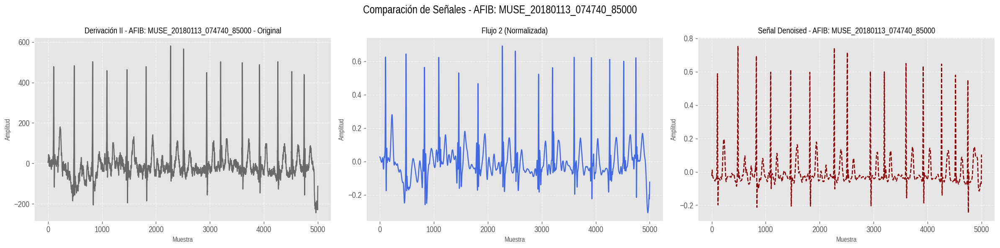

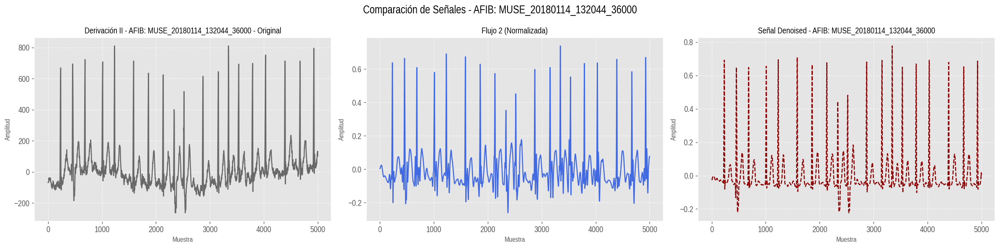

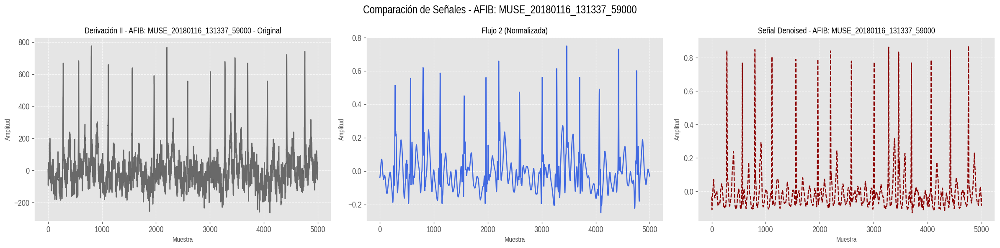

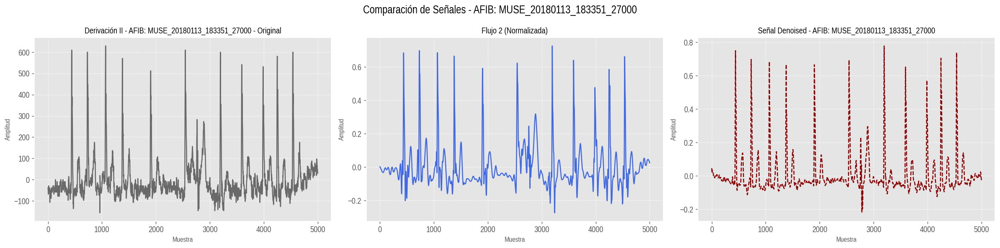

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os

# Función de normalización y graficado
def normalizacionYGraficar(directorios, tipo):
    for directorio in directorios[:10]:  # Puedes ajustar el número de archivos a observar
        csv_ruta = os.path.join('/content/drive/MyDrive/Colab Notebooks/Proyecto3/ECGData/', directorio + '.csv')
        csv_ruta_2 = os.path.join('/content/drive/MyDrive/Colab Notebooks/Proyecto3/ECGDataDenoised/', directorio + '.csv')

        try:
            df = pd.read_csv(csv_ruta)
            df2 = pd.read_csv(csv_ruta_2, header=None, names=['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6'])
            senal_original = df['II'].values
            senal_denoised = df2['II'].values

            # Asegurar que la señal no sea de tipo string u object
            senal_original = pd.to_numeric(senal_original, errors='coerce')

            # Aplicar los flujos
            senal_flujo1 = Flujo2(senal_original)

            # Aplica detrend, compresión y detrend nuevamente a la columna II
            senal_flujo1, _ = ajusteDetrend(senal_flujo1)
            senal_flujo1 = compresion(senal_flujo1)
            senal_flujo1, _ = ajusteDetrend(senal_flujo1)

            # Aplica detrend, compresión y detrend nuevamente a la columna II
            senal_denoised, _ = ajusteDetrend(senal_denoised)
            senal_denoised = compresion(senal_denoised)
            senal_denoised, _ = ajusteDetrend(senal_denoised)

            # Igualar la longitud de las señales
            min_len = min(len(senal_original), len(senal_flujo1), len(senal_denoised))
            senal_original = senal_original[:min_len]
            senal_flujo1 = senal_flujo1[:min_len]
            senal_denoised = senal_denoised[:min_len]

            # Graficar los resultados
            fig, axes = plt.subplots(1, 3, figsize=(20, 5))  # 1 fila, 3 columnas

            # Original signal plot
            axes[0].plot(senal_original, color='dimgray', linewidth=1.5)
            axes[0].set_title(f'Derivación II - {tipo}: {directorio} - Original', fontsize=12)
            axes[0].set_ylabel('Amplitud', fontsize=10)
            axes[0].set_xlabel('Muestra', fontsize=10)
            axes[0].grid(True, linestyle='--', alpha=0.7)

            # Flujo 1 plot (normalizada)
            axes[1].plot(senal_flujo1, color=COLORES[6], linewidth=1.5)
            axes[1].set_title('Flujo 2 (Normalizada)', fontsize=12)
            axes[1].set_ylabel('Amplitud', fontsize=10)
            axes[1].set_xlabel('Muestra', fontsize=10)
            axes[1].grid(True, linestyle='--', alpha=0.7)

            # Señal denoised
            axes[2].plot(senal_denoised, color='darkred', linewidth=1.5, linestyle='--')
            axes[2].set_title(f'Señal Denoised - {tipo}: {directorio}', fontsize=12)
            axes[2].set_ylabel('Amplitud', fontsize=10)
            axes[2].set_xlabel('Muestra', fontsize=10)
            axes[2].grid(True, linestyle='--', alpha=0.7)

            # Mejorar el diseño
            plt.tight_layout()
            plt.subplots_adjust(top=0.85)  # Espaciado superior para título general

            # Título general
            fig.suptitle(f'Comparación de Señales - {tipo}: {directorio}', fontsize=16)

            # Mostrar la gráfica
            plt.show()

        except FileNotFoundError:
            print(f"Archivo no encontrado: {csv_ruta}")

# Llamar a la función para ambos tipos de datos
print('Procesamiento de directorio SB:')
normalizacionYGraficar(directoriosSB, 'SB')

print('Procesamiento de directorio AFIB:')
normalizacionYGraficar(directoriosAFIB, 'AFIB')


### Análisis de las gráficas

> Una vez aplicado el proceso de normalización se observa en la señal resultante la conservación de una gran cantidad de picos de baja amplitud cercanos a  0.05 y 0.1, estos pequeñas oscilaciones no son características de la onda PQRS observada en los ECG ampliamente conocidos, por lo tanto, su aparición es posible asociarla a la presencia de interferencias residuales ocasionadas a ruidos externos captados durante la medición que no fuero eliminados en su totalidad.


## Quinta parte:

Para cada señal extraer la frecuencia que contiene la máxima potencia usando Welch.

Función que nos permite extraer la frecuencia de máxima potencia:

In [21]:
def obtenerMaximaFrec(senal, fs=500):
    nperseg = 1024
    noverlap = int(nperseg/2)
    f, Pxx = signal.welch(senal, fs=fs, window = 'hann', nperseg = nperseg, noverlap = noverlap)
    frecuencia_maxima_potencia = f[np.argmax(Pxx)]
    return frecuencia_maxima_potencia

Aplicado a las señales y observando Welch:

Procesamiento de directorio SB:


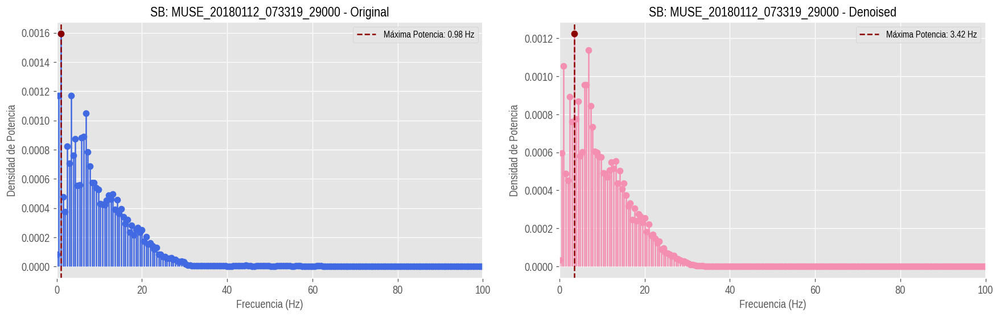

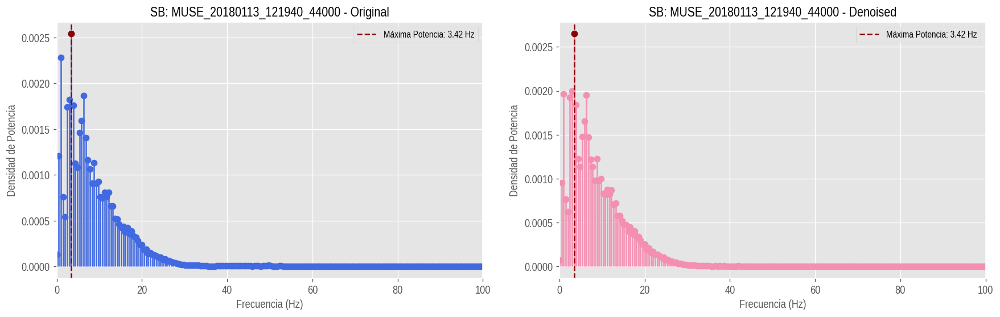

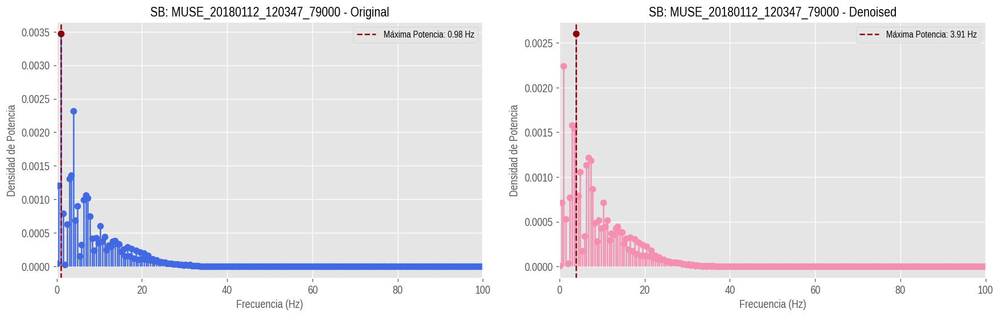

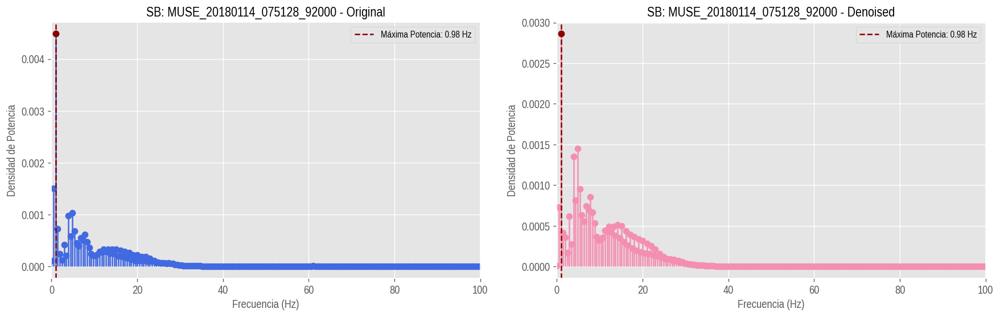

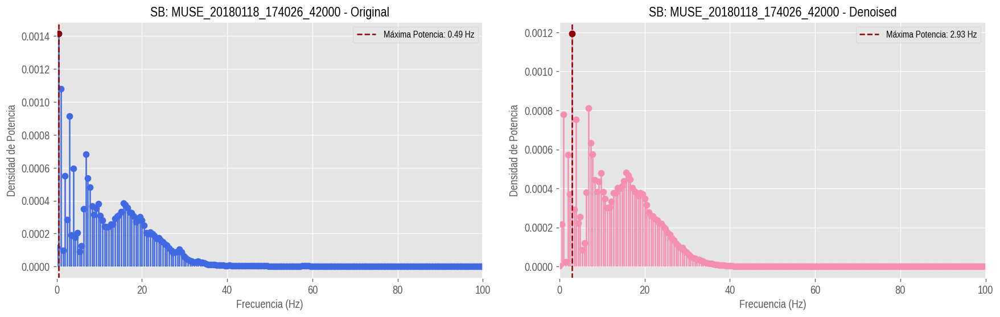

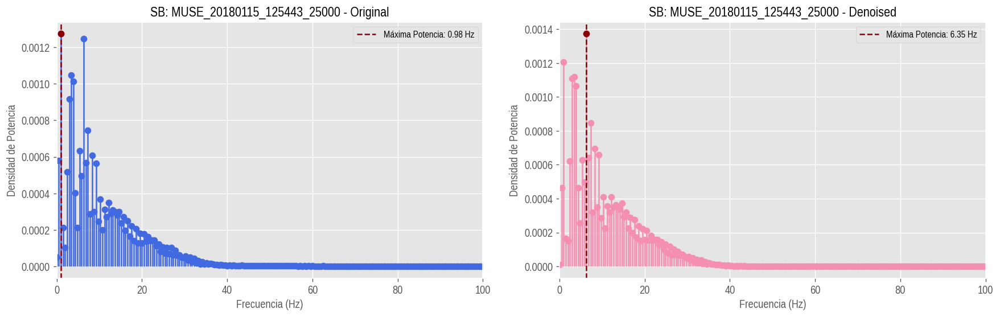

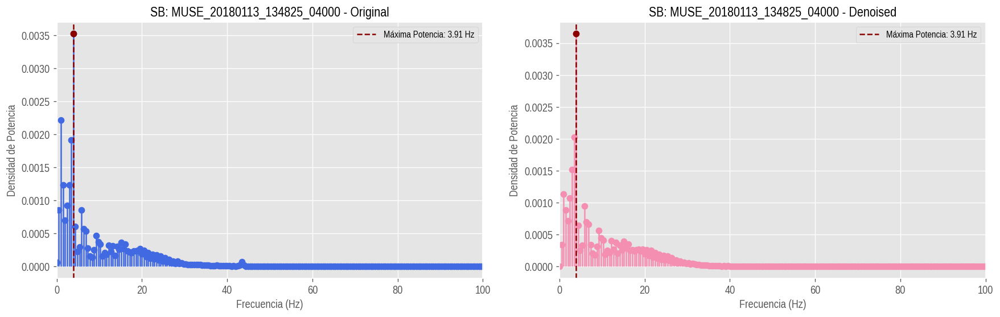

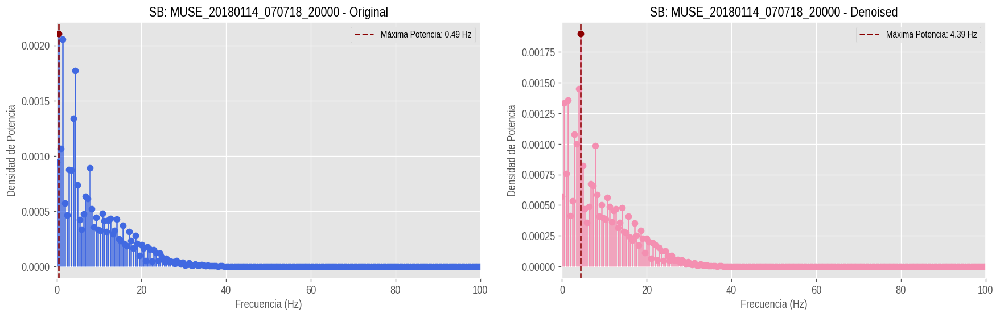

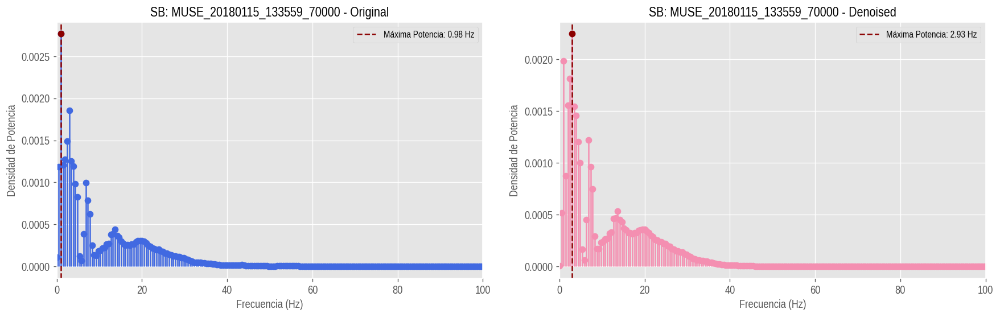

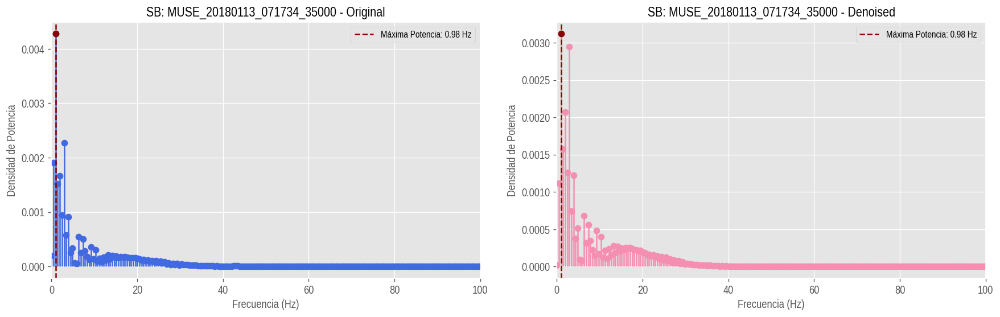

Procesamiento de directorio AFIB:


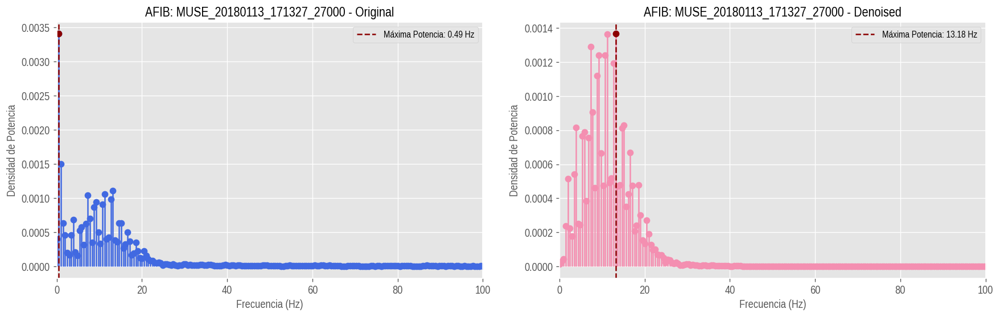

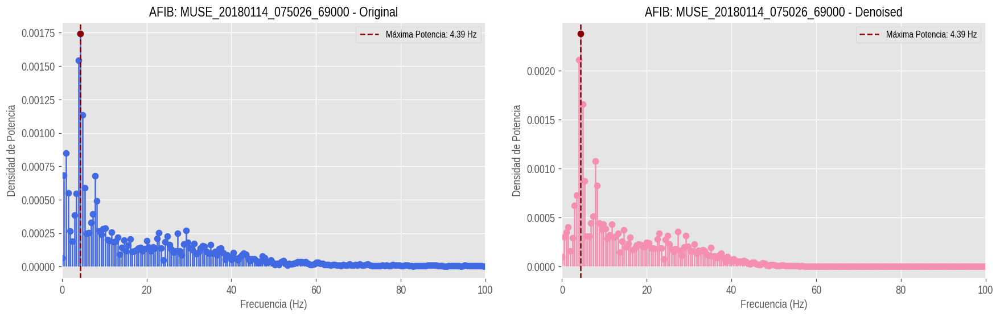

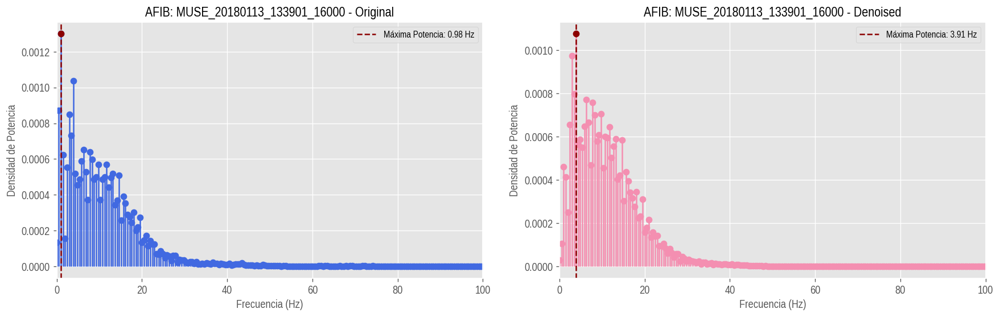

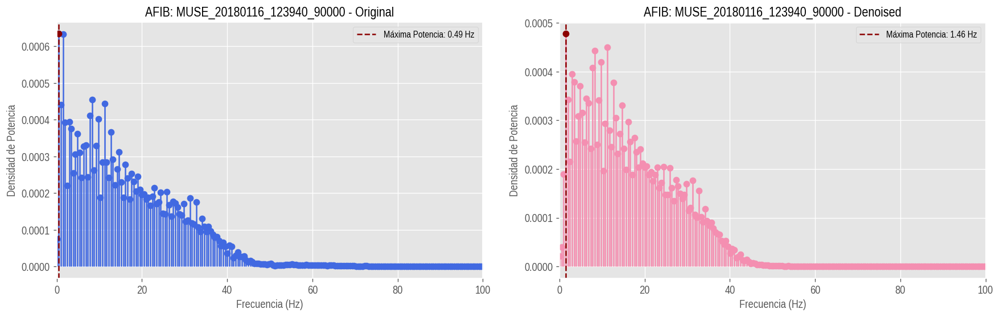

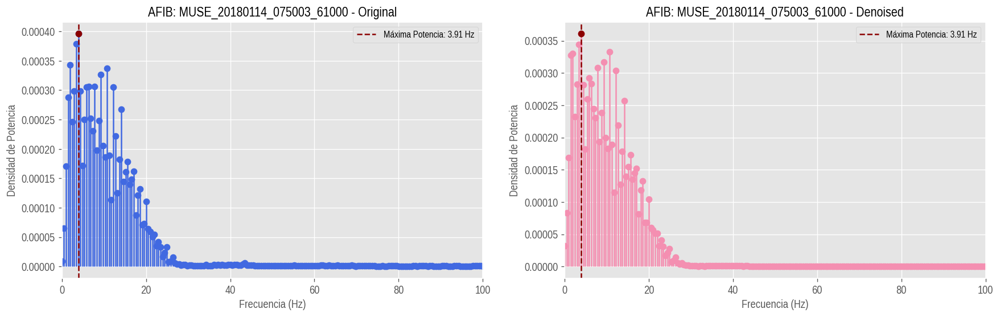

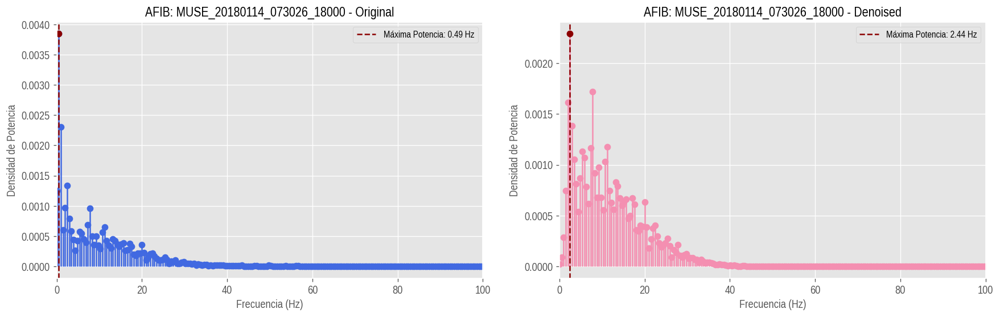

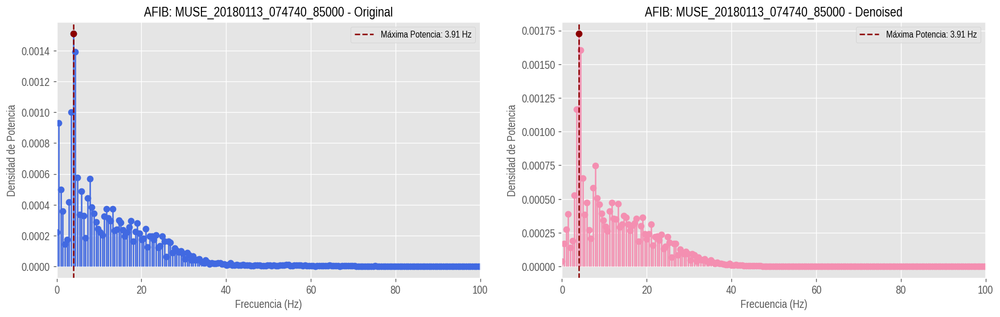

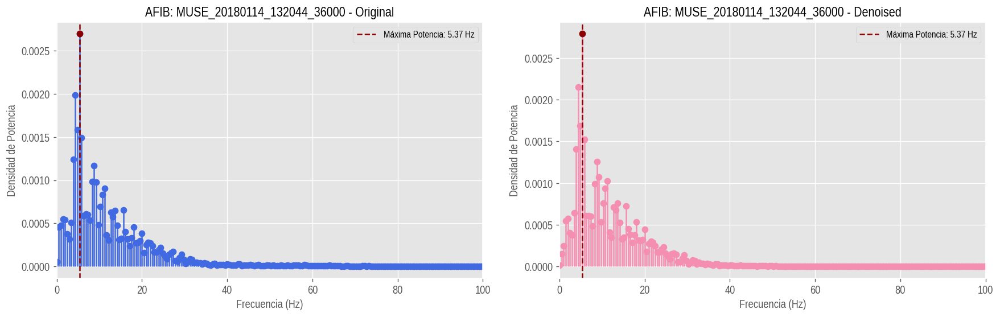

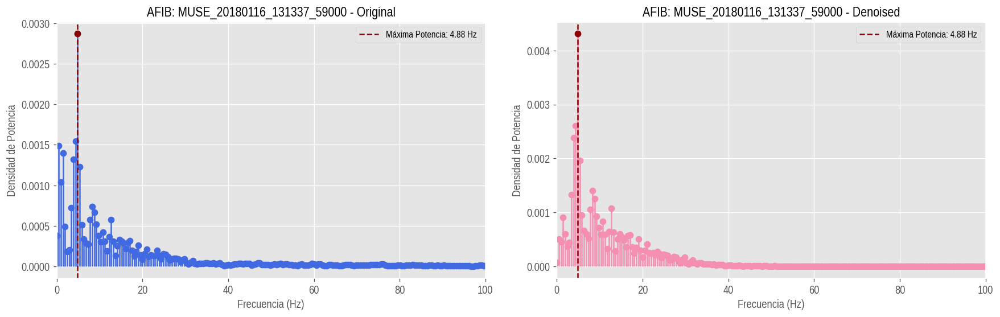

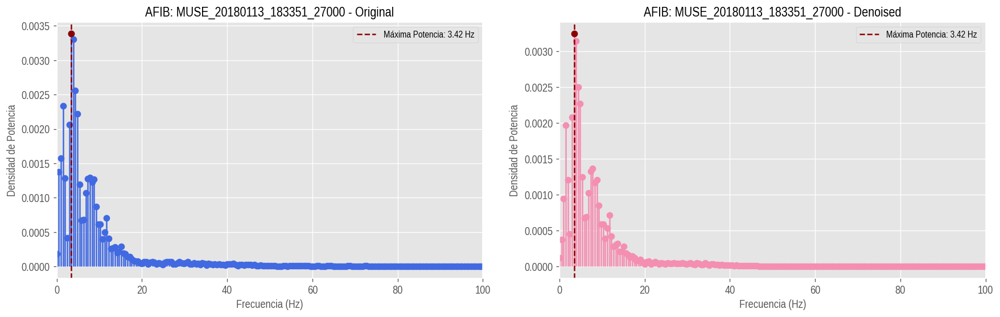

In [26]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

def graficarFrecuenciaMaximaPotencia(directorios, tipo):
    for directorio in directorios[:10]:  # Puedes ajustar el número de archivos a observar
        csv_ruta = os.path.join('/content/drive/MyDrive/Colab Notebooks/Proyecto3/ECGData/', directorio + '.csv')
        csv_ruta_2 = os.path.join('/content/drive/MyDrive/Colab Notebooks/Proyecto3/ECGDataDenoised/', directorio + '.csv')

        try:
            # Carga de datos
            df = pd.read_csv(csv_ruta)
            df2 = pd.read_csv(csv_ruta_2, header=None, names=['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6'])
            senal_original = pd.to_numeric(df['II'], errors='coerce').dropna().values
            senal_denoised = pd.to_numeric(df2['II'], errors='coerce').dropna().values

            # Preprocesamiento de señales
            senal_original, _ = ajusteDetrend(compresion(ajusteDetrend(senal_original)[0]))
            senal_denoised, _ = ajusteDetrend(compresion(ajusteDetrend(senal_denoised)[0]))

            # Obtener la frecuencia de máxima potencia
            frecuencia_maxima_original = obtenerMaximaFrec(senal_original)
            frecuencia_maxima_denoised = obtenerMaximaFrec(senal_denoised)

            # Gráfica
            fig, axes = plt.subplots(1, 2, figsize=(15, 5), dpi=120)  # Mayor calidad de imagen

            # Parámetros de Welch
            fs = 500  # Frecuencia de muestreo
            nperseg = 1024
            noverlap = int(nperseg / 2)

            # Espectro de potencia de la señal original
            f, Pxx = signal.welch(senal_original, fs=fs, window='hann', nperseg=nperseg, noverlap=noverlap)
            axes[0].stem(f, Pxx, basefmt=" ", linefmt=COLORES[6], markerfmt="o")  # Azul
            axes[0].axvline(frecuencia_maxima_original, color='darkred', linestyle='--', label=f'Máxima Potencia: {frecuencia_maxima_original:.2f} Hz')
            axes[0].plot(frecuencia_maxima_original, Pxx[np.argmax(f == frecuencia_maxima_original)], 'o', color='darkred')
            axes[0].set_xlim([0, 100])
            axes[0].set_title(f'{tipo}: {directorio} - Original')
            axes[0].set_xlabel('Frecuencia (Hz)')
            axes[0].set_ylabel('Densidad de Potencia')
            axes[0].legend(loc='upper right')

            # Espectro de potencia de la señal denoised
            f, Pxx = signal.welch(senal_denoised, fs=fs, window='hann', nperseg=nperseg, noverlap=noverlap)
            axes[1].stem(f, Pxx, basefmt=" ", linefmt=COLORES[2], markerfmt="o")  # Rosado
            axes[1].axvline(frecuencia_maxima_denoised, color='darkred', linestyle='--', label=f'Máxima Potencia: {frecuencia_maxima_denoised:.2f} Hz')
            axes[1].plot(frecuencia_maxima_denoised, Pxx[np.argmax(f == frecuencia_maxima_denoised)], 'o', color='darkred')
            axes[1].set_xlim([0, 100])
            axes[1].set_title(f'{tipo}: {directorio} - Denoised')
            axes[1].set_xlabel('Frecuencia (Hz)')
            axes[1].set_ylabel('Densidad de Potencia')
            axes[1].legend(loc='upper right')

            plt.tight_layout(pad=2)
            plt.show()

        except FileNotFoundError:
            print(f"Archivo no encontrado: {csv_ruta}")

# Llamar a la función para ambos tipos de datos
print('Procesamiento de directorio SB:')
graficarFrecuenciaMaximaPotencia(directoriosSB, 'SB')

print('Procesamiento de directorio AFIB:')
graficarFrecuenciaMaximaPotencia(directoriosAFIB, 'AFIB')

### Espectros de potencia en SB

> Al observar los espectros de potencia obtenidos para el grupo **SB** se indica que para ambos proyectos los picos más altos de esta componente se registran en frecuencias bajas, pertenecientes al intervalo de 0 a 20 Hz, siendo en este mismo rango donde se identifica la mayor concentración de energía, resultados que tienen sincronía con el comportamiento esperado para esta patología, caracterizada por la reducción regular de la frecuencia cardíaca del paciente, sin embargo, se debe resaltar que los datos del espectro de potencia del Proyecto N°3 son en promedio más elevados en comparación con los registros del proyecto N°2, hecho que indica la posible conservación de interferencias que incrementan la potencia de la señal en ciertos valores de frecuencia.


### Espectros de potencia en AFIB

> De acuerdo con las gráficas de espectro de potencias observadas para la enfermedad **AFIB** se señala el incremento del intervalo de frecuencias con potencia significativa en ambos proyectos, llegando a abarcar un rango de 0 a 40 Hz en comparación con los sujetos diagnosticados con SB, también se evidenció un comportamiento más irregular en la amplitud de la potencia denotando una carencia de periodicidad o tendencia común en la aparición de cada espectro, esta conducta se encuentra profundamente ligada al comportamiento rápido e impreciso de la fibrilación auricular, siendo un producto de la contracción rápida e incontrolada de las cavidades cardíacas.


## Sexta parte:

Crear una rutina que aplique sobre todos los archivos de la base de datos las rutina anteriores y almacene los resultados en un dataframe donde se pueda registro, tipo de patología y el frecuencia de máxima potencia.

| Registro | Estado | fMP |
|----------|--------|-----|
| ---      | ---    | --- |
| ---      | ---    | --- |

In [ ]:
import os
import pandas as pd
import numpy as np
from scipy.fft import fft

def crearDataframeP3(directorios, tipo):
    # Inicializa una lista para almacenar los resultados
    resultados = []

    for directorio in directorios:
        csv_ruta = os.path.join('/content/drive/MyDrive/Colab Notebooks/Proyecto3/ECGData/', directorio + '.csv')

        try:
            df = pd.read_csv(csv_ruta)
            senal_original = df['II'].values

            # Asegurar que la señal no sea de tipo string u object
            senal_original = pd.to_numeric(senal_original, errors='coerce')

            # Pasar por el flujo seleccionado
            senal = Flujo2(senal_original)

            # Procesamiento de la columna II
            senal, _ = ajusteDetrend(senal)
            senal = compresion(senal)
            senal, _ = ajusteDetrend(senal)

            # Encontrar la frecuencia de máxima potencia
            fMP = obtenerMaximaFrec(senal)

            # Agregar los resultados a la lista sin la columna `sFSB`
            resultados.append({'Registro': directorio, 'Estado': tipo, 'fMP': fMP})

        except FileNotFoundError:
            print(f"Archivo no encontrado: {csv_ruta}")

    # Crear el DataFrame solo una vez al final
    df = pd.DataFrame(resultados)
    return df

# Llamar a la función para ambas categorías
print("SB:")
dfSB_3 = crearDataframeP3(directoriosSB, 'SB')
display(dfSB_3)
print("AFIB:")
dfAFIB_3 = crearDataframeP3(directoriosAFIB, 'AFIB')
display(dfAFIB_3)

In [ ]:
df_completo = pd.concat([dfSB_3, dfAFIB_3], ignore_index=True)
display(df_completo)

In [ ]:
from google.colab import drive
import pandas as pd

# Montar Google Drive (ejecuta solo una vez en cada sesión de Colab)
drive.mount('/content/drive')

# Especifica la ruta de la carpeta de Google Drive
ruta_guardado = '/content/drive/MyDrive/Colab Notebooks/Proyecto3/df_completo_p3_f2.csv'

# Guarda el DataFrame en formato CSV
df_completo.to_csv(ruta_guardado, index=False)

print(f"Archivo guardado en: {ruta_guardado}")

## Septima parte:

Comparar los resultados de fMP del proyecto 3 con los del proyecto 2 usando estadística descriptiva: gráficos y pruebas de hipótesis.

Datos del proyecto 2:

In [ ]:
import os
import pandas as pd
import numpy as np
from scipy.fft import fft

def crearDataframeP2(directorios, tipo):
    # Inicializa una lista para almacenar los resultados
    resultados = []

    for directorio in directorios:
        csv_ruta = os.path.join('/content/drive/MyDrive/Colab Notebooks/Proyecto3/ECGDataDenoised/', directorio + '.csv')

        try:
            derivaciones = pd.read_csv(csv_ruta, header=None, names=['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6'])

            # Procesamiento de la columna II
            dv_detrend, _ = ajusteDetrend(pd.to_numeric(derivaciones['II'].values, errors='coerce'))
            dv_detrend_compressed = compresion(dv_detrend)
            dv_completo, _ = ajusteDetrend(dv_detrend_compressed)

            # Encontrar la frecuencia de máxima potencia
            fMP = obtenerMaximaFrec(dv_completo)

            # Agregar los resultados a la lista sin la columna `sFSB`
            resultados.append({'Registro': directorio, 'Estado': tipo, 'fMP': fMP})

        except FileNotFoundError:
            print(f"Archivo no encontrado: {csv_ruta}")

    # Crear el DataFrame solo una vez al final
    df = pd.DataFrame(resultados)
    return df

# Llamar a la función para ambas categorías
print("SB:")
dfSB = crearDataframeP2(directoriosSB, 'SB')
display(dfSB)
print("AFIB:")
dfAFIB = crearDataframeP2(directoriosAFIB, 'AFIB')
display(dfAFIB)


In [ ]:
df_completo = pd.concat([dfSB, dfAFIB], ignore_index=True)
display(df_completo)

In [ ]:
from google.colab import drive
import pandas as pd

# Montar Google Drive (ejecuta solo una vez en cada sesión de Colab)
drive.mount('/content/drive')

# Especifica la ruta de la carpeta de Google Drive
ruta_guardado = '/content/drive/MyDrive/Colab Notebooks/Proyecto3/df_completo_p2.csv'

# Guarda el DataFrame en formato CSV
df_completo.to_csv(ruta_guardado, index=False)

print(f"Archivo guardado en: {ruta_guardado}")


In [27]:
ruta_guardado_p2 = '/content/drive/MyDrive/Colab Notebooks/Proyecto3/df_completo_p2.csv'
ruta_guardado_p3_f2 = '/content/drive/MyDrive/Colab Notebooks/Proyecto3/df_completo_p3_f2.csv'

try:
  datosProyecto2 = pd.read_csv(ruta_guardado_p2)
  datosProyecto3 = pd.read_csv(ruta_guardado_p3_f2)
  print("DataFrames cargados exitosamente.")
except FileNotFoundError:
  print("Uno o ambos archivos no se encontraron en la ruta especificada.")


DataFrames cargados exitosamente.



Estadísticas de fMP por Estado en datosProyecto2:


,mean,std,min,max
Estado,,,,
AFIB,3.931761,2.606417,0.488281,49.804688
SB,3.166921,2.309195,0.488281,49.804688



Estadísticas de fMP por Estado en datosProyecto3:


,mean,std,min,max
Estado,,,,
AFIB,2.782929,2.128784,0.488281,19.042969
SB,1.834727,1.599257,0.488281,12.207031


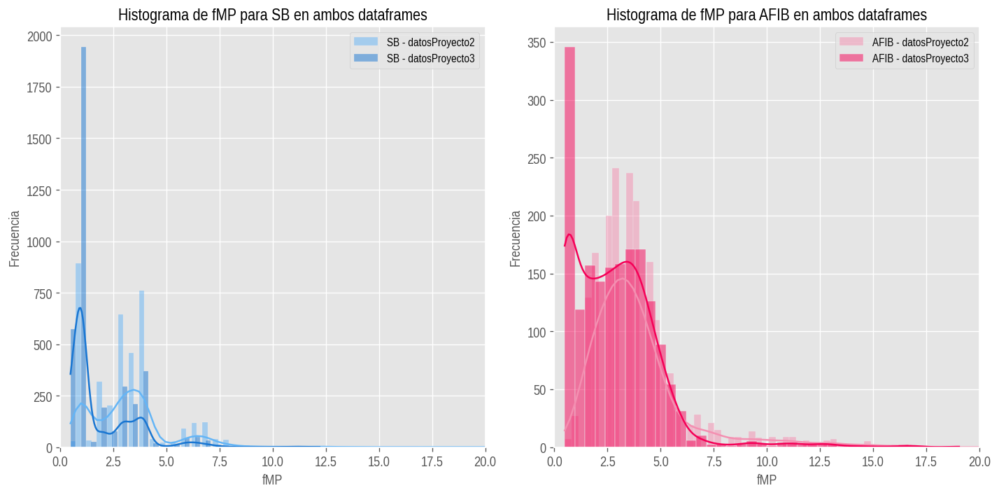

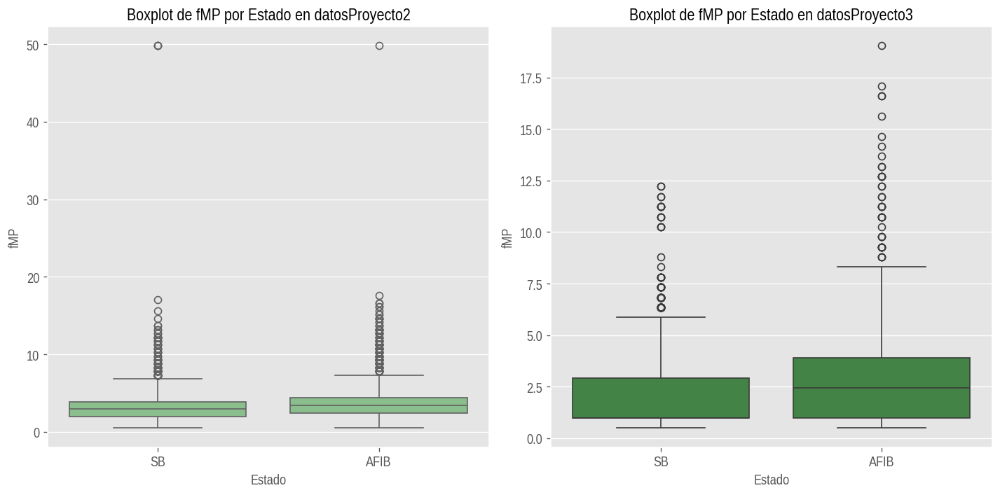


Coeficiente de variación fMP SB - datosProyecto2: 0.7290672556311604
Coeficiente de variación fMP AFIB - datosProyecto2: 0.6627269779108641
Coeficiente de variación fMP SB - datosProyecto3: 0.8715474828306036
Coeficiente de variación fMP AFIB - datosProyecto3: 0.7647289029964759


In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Estadísticas agrupadas por estado en ambos dataframes
estadisticas_fmp_proyecto2 = datosProyecto2.groupby('Estado')['fMP'].agg(['mean', 'std', 'min', 'max'])
estadisticas_fmp_proyecto3 = datosProyecto3.groupby('Estado')['fMP'].agg(['mean', 'std', 'min', 'max'])

# Mostrar estadísticas agrupadas
print("\nEstadísticas de fMP por Estado en datosProyecto2:")
display(estadisticas_fmp_proyecto2)
print("\nEstadísticas de fMP por Estado en datosProyecto3:")
display(estadisticas_fmp_proyecto3)

# Histogramas de fMP por estado en ambos dataframes
plt.figure(figsize=(12, 6))

# Histograma de fMP para SB y AFIB en datosProyecto2 y datosProyecto3
plt.subplot(1, 2, 1)
sns.histplot(datosProyecto2[datosProyecto2['Estado'] == 'SB']['fMP'], label='SB - datosProyecto2', kde=True, color=COLORES[4], alpha=0.5)
sns.histplot(datosProyecto3[datosProyecto3['Estado'] == 'SB']['fMP'], label='SB - datosProyecto3', kde=True, color=COLORES[5], alpha=0.5)
plt.xlabel('fMP')
plt.ylabel('Frecuencia')
plt.title('Histograma de fMP para SB en ambos dataframes')
plt.xlim(0, 20)  # Limitar el eje x hasta 30
plt.legend()

plt.subplot(1, 2, 2)
sns.histplot(datosProyecto2[datosProyecto2['Estado'] == 'AFIB']['fMP'], label='AFIB - datosProyecto2', kde=True, color=COLORES[2], alpha=0.5)
sns.histplot(datosProyecto3[datosProyecto3['Estado'] == 'AFIB']['fMP'], label='AFIB - datosProyecto3', kde=True, color=COLORES[3], alpha=0.5)
plt.xlabel('fMP')
plt.ylabel('Frecuencia')
plt.title('Histograma de fMP para AFIB en ambos dataframes')
plt.xlim(0, 20)  # Limitar el eje x hasta 30
plt.legend()

plt.tight_layout()
plt.show()

# Boxplots de fMP por estado en ambos dataframes
plt.figure(figsize=(12, 6))

# Boxplot de fMP para SB y AFIB en datosProyecto2
plt.subplot(1, 2, 1)
sns.boxplot(x='Estado', y='fMP', data=datosProyecto2, color=COLORES[0])
plt.title('Boxplot de fMP por Estado en datosProyecto2')

# Boxplot de fMP para SB y AFIB en datosProyecto3
plt.subplot(1, 2, 2)
sns.boxplot(x='Estado', y='fMP', data=datosProyecto3, color=COLORES[1])
plt.title('Boxplot de fMP por Estado en datosProyecto3')

plt.tight_layout()
plt.show()

# Cálculo del coeficiente de variación para fMP en ambos dataframes
cv_fmp_sb_proyecto2 = np.std(datosProyecto2[datosProyecto2['Estado'] == 'SB']['fMP']) / np.mean(datosProyecto2[datosProyecto2['Estado'] == 'SB']['fMP'])
cv_fmp_afib_proyecto2 = np.std(datosProyecto2[datosProyecto2['Estado'] == 'AFIB']['fMP']) / np.mean(datosProyecto2[datosProyecto2['Estado'] == 'AFIB']['fMP'])
cv_fmp_sb_proyecto3 = np.std(datosProyecto3[datosProyecto3['Estado'] == 'SB']['fMP']) / np.mean(datosProyecto3[datosProyecto3['Estado'] == 'SB']['fMP'])
cv_fmp_afib_proyecto3 = np.std(datosProyecto3[datosProyecto3['Estado'] == 'AFIB']['fMP']) / np.mean(datosProyecto3[datosProyecto3['Estado'] == 'AFIB']['fMP'])

print(f"\nCoeficiente de variación fMP SB - datosProyecto2: {cv_fmp_sb_proyecto2}")
print(f"Coeficiente de variación fMP AFIB - datosProyecto2: {cv_fmp_afib_proyecto2}")
print(f"Coeficiente de variación fMP SB - datosProyecto3: {cv_fmp_sb_proyecto3}")
print(f"Coeficiente de variación fMP AFIB - datosProyecto3: {cv_fmp_afib_proyecto3}")


## Histogramas

> De acuerdo con los histogramas presentados anteriormente se observan los siguientes comportamientos para cada enfermedad


> **SB:**  la curva de distribución de fMP para la bradicardia sinusal cuenta con una mayor concentración en los valores de baja frecuencia para las señales filtradas de ambos proyectos en un intervalo de 0 a 5 Hz, (indicando el comportamiento lento y regular característico de esta patología), por otro lado, es importante resaltar que ambos datos cuentan con una frecuencia de máxima potencia similar, esto debido a que en ninguno de los dos grupos se supera una fMP de 8, este último hecho indica que al aplicar un proceso de filtrado diferente como lo fue el procedimiento elaborado en este proyecto, no se alteraron significativamente los resultados en comparación con las señales filtradas que se emplearon en el proyecto N°2, llegándose a observar en el gráfico del proyecto N°3  unas leves perturbaciones asociadas a ruido residual presente en los datos que restaron continuidad y un trazo más limpio de la curva.

> **AFIB:** se destaca que la curva de distribución para la fibrilación auricular es más dispersa, razón por la cual cuenta con una mayor variabilidad de los valores de AFIB y de frecuencias alcanzadas, este comportamiento corrobora las características propias de la enfermedad de movimientos rápidos e irregulares por la falta de control del nodo sinoauricular, no obstante, a pesar de evidenciar un comportamiento similar en las señales filtradas de ambos proyectos, se destaca que el proyecto N°2 cuenta con una curva más definida y con menor cantidad de oscilaciones, factor que puede indicar que el proceso de filtrado de este proyecto N°3 para las señales AFIB conservó un leve ruido residual que dio como resultado un impactó más evidente de las perturbaciones indeseadas en la visualización de las señales deseadas.

> Por medio de lo anterior se destaca que las perturbaciones residuales que no fueron efectivamente filtradas en el proyecto N°3 se pueden observar con mayor facilidad en los datos AFIB que en los datos SB, sin embargo, se conserva una conducta similar a la esperada con las señales filtradas del proyecto N°2.


## Cajas de bigotes

Gracias a los gráficos de cajas y bigotes elaborados para cada enfermedad y proyecto se pueden señalar las siguientes características:

> **SB:** Para los datos del proyecto N°2 se observa que el rango abarcado entre la caja y los bigotes [0.5 - 10] es mayor en comparación con el intervalo abarcado con las señales del proyecto N°3 [0.5 - 6], comportamiento que indica que los datos trabajados en el proyecto N°2 cuentan con una mayor dispersión y variabilidad, logrando expresar la mayor diversidad de frecuencias de máxima potencia de esta patología, en esta situación se asume que el ruido residual en las señales filtradas del proyecto N°3 fue el causante de la uniformidad de los datos y reducción de la dispersión. Incluso teniendo en cuenta lo anterior, se identifica que en ambos proyectos los valores fMP tomados son en su mayoría bajos con una mediana próxima a 2Hz con un leve sesgo al límite inferior.

> **AFIB:** se evidenció que para ambos proyectos la patología AFIB presenta la mayor cantidad de valores atípicos, siendo más abundantes en el proyecto N°2 que en el proyecto N°3, donde en este último la mediana es significativamente menor y próxima a 2.5 fMP. Adicionalmente, se indica que las señales AFIB del proyecto N°2 cuentan con frecuencias de máximas potencias más elevadas y con comportamientos más irregulares surgidos por condiciones cardíacas inusuales o ruidos, esto como producto de la cantidad de datos atípicos, estas señales llegan a abarcar un rango de 0.1 a 8 fMP. Por medio de lo anterior, es posible destacar que el proceso de filtrado hecho en el proyecto N°3 presenta inconvenientes para la detección de la mayor variabilidad de los datos y por consecuencia la identificación de mayores frecuencias de máxima potencia, presentando un rango de trabajo de 2Hz a 7.5 fMP. No obstante, se indica que ambos grupos presentan conductas similares al presentar un leve sesgo hacia el cuartil inferior y contar con rangos más altos de frecuencia en comparación del grupo SB, retratando el comportamiento disperso de la enfermedad.


In [33]:
import numpy as np
import pandas as pd
import scipy.stats as stats

# Obtenemos los datos de fMP para SB y AFIB en cada proyecto por separado
fmp_sb_proyecto2 = datosProyecto2[datosProyecto2['Estado'] == 'SB']['fMP']
fmp_afib_proyecto2 = datosProyecto2[datosProyecto2['Estado'] == 'AFIB']['fMP']
fmp_sb_proyecto3 = datosProyecto3[datosProyecto3['Estado'] == 'SB']['fMP']
fmp_afib_proyecto3 = datosProyecto3[datosProyecto3['Estado'] == 'AFIB']['fMP']

# Función para realizar pruebas y retornar resultados detallados
def realizar_prueba(data1, data2, grupo):
    # Prueba de normalidad con Kolmogorov-Smirnov
    ks_1 = stats.kstest(data1, 'norm', args=(np.mean(data1), np.std(data1)))
    ks_2 = stats.kstest(data2, 'norm', args=(np.mean(data2), np.std(data2)))

    # Prueba de homocedasticidad con Levene
    homocedasticidad = stats.levene(data1, data2)

    # Evaluar normalidad
    normalidad_resultados = {
        f'Normalidad {grupo} Proyecto 2': 'Aceptar H0: Los datos son normales' if ks_1.pvalue > 0.05 else 'Rechazar H0: Los datos no son normales',
        f'Normalidad {grupo} Proyecto 3': 'Aceptar H0: Los datos son normales' if ks_2.pvalue > 0.05 else 'Rechazar H0: Los datos no son normales'
    }

    # Evaluar homocedasticidad
    homocedasticidad_resultado = {
        'Homocedasticidad': 'Aceptar H0: Las varianzas son iguales' if homocedasticidad.pvalue > 0.05 else 'Rechazar H0: Las varianzas no son iguales'
    }

    # Decidir qué prueba utilizar
    if ks_1.pvalue > 0.05 and ks_2.pvalue > 0.05 and homocedasticidad.pvalue > 0.05:
        # Usar prueba t de Student si normalidad y homocedasticidad son aceptadas
        t_statistic, p_value = stats.ttest_ind(data1, data2)
        prueba = "Prueba t de Student"
        decision = f'Rechaza H0: Hay diferencias significativas en fMP entre {grupo} en Proyecto 2 y Proyecto 3.' if p_value < 0.05 else f'Acepta H0: No hay diferencias significativas en fMP entre {grupo} en Proyecto 2 y Proyecto 3.'
    else:
        # Usar prueba U de Mann-Whitney si no se cumplen las condiciones
        u_statistic, p_value = stats.mannwhitneyu(data1, data2)
        prueba = "Prueba U de Mann-Whitney"
        decision = f'Rechaza H0: Hay diferencias significativas en fMP entre {grupo} en Proyecto 2 y Proyecto 3.' if p_value < 0.05 else f'Acepta H0: No hay diferencias significativas en fMP entre {grupo} en Proyecto 2 y Proyecto 3.'

    return {
        'prueba': prueba,
        'normalidad': normalidad_resultados,
        'homocedasticidad': homocedasticidad_resultado,
        'decision': decision
    }

# Realizar la prueba para fMP entre SB en Proyecto 2 y Proyecto 3
resultado_fmp_sb = realizar_prueba(fmp_sb_proyecto2, fmp_sb_proyecto3, "SB")

# Realizar la prueba para fMP entre AFIB en Proyecto 2 y Proyecto 3
resultado_fmp_afib = realizar_prueba(fmp_afib_proyecto2, fmp_afib_proyecto3, "AFIB")

# Crear DataFrame para resultados de fMP entre SB
df_resultados_fmp_sb = pd.DataFrame({
    'Prueba': [resultado_fmp_sb['prueba']],
    'Decisión': [resultado_fmp_sb['decision']],
    'Normalidad SB Proyecto 2': [resultado_fmp_sb['normalidad']['Normalidad SB Proyecto 2']],
    'Normalidad SB Proyecto 3': [resultado_fmp_sb['normalidad']['Normalidad SB Proyecto 3']],
    'Homocedasticidad': [resultado_fmp_sb['homocedasticidad']['Homocedasticidad']]
})

# Crear DataFrame para resultados de fMP entre AFIB
df_resultados_fmp_afib = pd.DataFrame({
    'Prueba': [resultado_fmp_afib['prueba']],
    'Decisión': [resultado_fmp_afib['decision']],
    'Normalidad AFIB Proyecto 2': [resultado_fmp_afib['normalidad']['Normalidad AFIB Proyecto 2']],
    'Normalidad AFIB Proyecto 3': [resultado_fmp_afib['normalidad']['Normalidad AFIB Proyecto 3']],
    'Homocedasticidad': [resultado_fmp_afib['homocedasticidad']['Homocedasticidad']]
})

# Ajustar la configuración de pandas para que no se corten las columnas ni filas
pd.set_option('display.max_columns', None)  # Mostrar todas las columnas
pd.set_option('display.max_rows', None)     # Mostrar todas las filas
pd.set_option('display.width', None)        # Sin límite de ancho
pd.set_option('display.max_colwidth', None) # Mostrar texto completo en las celdas

# Imprimir los resultados
print("Resultados de la prueba para fMP entre SB en Proyecto 2 y Proyecto 3:")
display(df_resultados_fmp_sb)

print("\nResultados de la prueba para fMP entre AFIB en Proyecto 2 y Proyecto 3:")
display(df_resultados_fmp_afib)



Resultados de la prueba para fMP entre SB en Proyecto 2 y Proyecto 3:


,Prueba,Decisión,Normalidad SB Proyecto 2,Normalidad SB Proyecto 3,Homocedasticidad
0,Prueba U de Mann-Whitney,Rechaza H0: Hay diferencias significativas en fMP entre SB en Proyecto 2 y Proyecto 3.,Rechazar H0: Los datos no son normales,Rechazar H0: Los datos no son normales,Rechazar H0: Las varianzas no son iguales



Resultados de la prueba para fMP entre AFIB en Proyecto 2 y Proyecto 3:


,Prueba,Decisión,Normalidad AFIB Proyecto 2,Normalidad AFIB Proyecto 3,Homocedasticidad
0,Prueba U de Mann-Whitney,Rechaza H0: Hay diferencias significativas en fMP entre AFIB en Proyecto 2 y Proyecto 3.,Rechazar H0: Los datos no son normales,Rechazar H0: Los datos no son normales,Aceptar H0: Las varianzas son iguales


## Supuestos para la realización de pruebas parámetricas y no paramétricas

**Prueba de normalidad:**

> Con el fin de comprobar la distribución de los datos, se realizó una prueba de Kolmogórov, que puede llevarse a cabo en grupos con un tamaño superior de 50 muestras. Esta técnica se aplicó a los archivos correspondientes de la derivación N°2 analizados para cada grupo de sujetos evaluados (AFIB, y SB). A continuación, se plantean las siguientes hipótesis generales de normalidad, estableciendo como criterio un 𝛼=0.05.

**𝐇𝑜:** Los datos para el parámetro analizado tienen una distribución normal.

**𝐇𝟏:** Los datos para el parámetro analizado no cuentan con una distribución normal.

> Grupo de patología de AFIB.

> Se realizó la prueba de Kolmogórov en cada una de las 1780 muestras de pacientes diagnosticados con AFIB respecto a los parámetros de FMP, por medio de la cual se observó que, para cada uno de los archivos, se obtuvo un valor de 𝒑<𝛼. Por lo tanto, se rechaza la hipótesis nula de distribución normal, apoyando la hipótesis alternativa, que indica que los datos no presentan una tendencia conocida en ambos proyectos.

> Grupo de patología de SB.

> Se ejecutó la prueba de Kolmogórov en cada uno de los 3888 sujetos diagnosticados con SB tomando como base los parámetros de FMP. En este caso, se evidenció que la totalidad de los datos no siguen una distribución normal en los dos proyectos analizados, por consiguiente, se rechaza la hipótesis nula que sostenía la tendencia lineal de las variables.

**Prueba de homocedasticidad:**

> Con el fin de analizar la similitud de las varianzas respecto a las FMP de cada patología (SB y AFIB), se realizó una prueba de Levene. Esta prueba permite corroborar o descartar si las muestras provienen de una población con igual varianza y sí sus diferencias pueden deberse a elementos aleatorios. Para desarrollar este método, se estipularon las siguientes hipótesis generales para cada par de archivos de los grupos patológicos:

**𝐇𝑜:** El parámetro FMP del grupo de AFIB y SB presentan igualdad de varianzas (σ𝟣 = σ𝟤 = ⋯ = σn).

**𝐇𝟏:** Al menos una de las varianzas del parámetro FMP del grupo de AFIB y SB es diferente.

> Se recopilaron las señales de cada grupo patológico con el fin de contrastar todas las varianzas y se encontró que para el FMP se tiene un valor 𝒑<𝛼, siendo α = 0.05. Por lo tanto, se rechazó la hipótesis nula y se respaldó la hipótesis alternativa, indicando que no hay presencia del fenómeno de homocedasticidad, es decir, no hay igualdad de las varianzas entre el grupo de AFIB y SB respecto a la frecuencia de máxima potencia en ninguno de los dos proyectos.

**Prueba no paramétrica U de Mann-Whitney:**

> Debido al incumplimiento de la prueba de normalidad, se decidió optar por el desarrollo de pruebas no paramétricas, para ello se realizó la prueba U de Mann-Whitney en los parámetros de FMP entre los grupos de SB y AFIB  de ambos proyectos tomando un valor α = 0.05 para las siguientes hipótesis:

**𝐇𝑜:** No existe diferencia en la tendencia central (mediana) entre el parámetro FMP de los grupos de AFIB y SB del proyecto N°2 respecto a los grupos AFIB y SB del proyecto N°3, respectivamente.

**𝐇𝟭:** Existe diferencia en la tendencia central de los datos entre el parámetro FMP de los grupos de AFIB y  grupo SB de los proyectos N°2 y N°3

> Se observó que para el parámetro de FMP de las muestras de  SB y AFIB pertenecientes al  proyecto N°2 y N°3 presentaron un valor p < α, lo que indica que hay una diferencia significativa en las tendencias centrales de ambos grupos patológicos de cada trabajo, por consecuente los procesos de filtrados ejecutados no obtuvieron la igualdad de resultados observados en las señales trabajadas del proyecto N°2  hecho que permite señalar la conservación del ruido residual proveniente de actividades fisiológicas de bajas frecuencias como lo es el movimiento de la caja toráxica en el proceso de respiración, movimientos espasmódicos del paciente durante la toma de muestras, sudor y baja adherencia de los electrodos, entre otros factores. Este fenómeno permite indicar las diferencias de las señales filtradas de ambos proyectos y lo esencial que es la adecuada supresión de interferencias de baja potencia.

> Sin embargo, se logró evidenciar la adecuada discriminación entre los sujetos diagnosticados con AFIB y los individuos diagnosticados con SB, por medio de lo anterior es posible distinguir las actividades cardíacas inusuales a través del desarrollo de un filtro basado en Detrend, Wavelet y un filtro pasa bajas tipo FIR, teniendo en cuenta la presencia poco significativa de perturbaciones residuales.



# Conclusiones

> 1. Los procesos de filtrado de señales son etapas vitales para la adecuada interpretación e identificación de patologías cardíacas como AFIB y SB, se identificó que a pesar de que se conserva un leve ruido residual en el procedimiento de filtrado del proyecto N°3 con flujo 2 se obtuvieron respuestas similares a las señales trabajadas en el proyecto N°2, no obstante, estas leves alteraciones pueden entorpecer la identificación de las ondas PQRS.

> 2. El flujo 2 aplicado es adecuado para la discriminación entre los dos grupos patológicos de AFIB y SB mediante el parámetro de fMP, presentando mayor concentración de energía en frecuencias bajas para la bradicardia sinusal y un mayor intervalo de frecuencias con potencias irregulares para la fibrilación auricular, siendo este comportamiento similar al visto en el proyecto pasado.

> 3. La conservación del ruido residual se encuentra ligado a las posibles imprecisiones del filtro FIR aplicado, el cual cuenta con una leve distorsión de fase y ripples en su banda de rechazo que pueden alterar la forma de la señal original, también se resalta la influencia del filtro Wavelet cuya similitud con la onda evaluada no fue suficiente para adaptarse de forma fiel a los cambios oscilatorios de los grupos patológicos observados, donde a su vez es importante tener en cuenta el desajuste numérico originado por la implementación de un eliminador de tendencia lineal.



# Referencias bibliográficas

- **[1]** W. S. Cleveland, "Robust Locally Weighted Regression and Smoothing Scatterplots," Journal of the American Statistical Association, vol. 74, no. 368, pp. 829–836, 1979. doi: 10.1080/01621459.1979.10481038.

- **[2]** G. Smyth, "Difference between LOESS and LOWESS," Cross Validated, Jun. 15, 2020. [Online]. Available: https://stats.stackexchange.com/q/472370. [Accessed: May 2, 2024].

- **[3]** The MathWorks, Inc., "Visible Breadcrumbs," Mathworks.com, 2024. [Online]. Available: https://la.mathworks.com/help/curvefit/smoothing-data.html#bq_6ys3-3. [Accessed: Oct. 27, 2024].

- **[4]** National Institute of Standards and Technology (NIST), "CHAPTER 4.1.4.4. LOESS (aka LOWESS)," Engineering Statistics Handbook, Nist.gov, 2024. [Online]. Available: https://www.itl.nist.gov/div898/handbook//pmd/section1/pmd144.htm. [Accessed: Oct. 27, 2024].

- **[5]** J. Greene, "A Tutorial for LOWESS, Robust, and Least Squares Curves," CUBICinfinity, Mar. 2019. [Online]. Available: https://cubicinfinity.com/LowessRobustLeastSquares.html.

- **[6]** A. Singh, “Mastering Sliding Window Techniques,” Medium, Aug. 08, 2023. https://medium.com/@rishu__2701/mastering-sliding-window-techniques-48f819194fd7

- **[7]** Carnegie Mellon University, "Extending Linear Regression: Weighted Least Squares and Local Regression," 36-350, Data Mining, Oct. 10, 2008. [Online]. Available: https://www.stat.cmu.edu/~cshalizi/350/2008/lectures/18/lecture-18.pdf.

- **[8]** M. Cappellari, "loess 2.1.2," The LOESS Package, PyPI, Python Package Index, Jan. 31, 2022. [Online]. Available: https://pypi.org/project/loess/.

- **[9]** X. B. Sicotte, "Locally Weighted Linear Regression (Loess)," Data Blog, Data Science, Machine Learning and Statistics, implemented in Python, May 24, 2018. [Online]. Available: https://xavierbourretsicotte.github.io/loess.html.

- **[10]** A. Buades, B. Coll, and J.-M. Morel, "Non-Local Means Denoising," Image Processing On Line, vol. 1, pp. 1-10, Sep. 13, 2011. [Online]. Available: https://doi.org/10.5201/ipol.2011.bcm_nlm. [Accessed: Jun. 16, 2015].

- **[11]** L. Huang, "Improved Non-Local Means Algorithm for Image Denoising," Journal of Computer and Communications, vol. 3, pp. 23–29, 2015. doi: 10.4236/jcc.2015.34003.

- **[12]** B. H. Tracey and E. L. Miller, "Nonlocal Means Denoising of ECG Signals," in IEEE Transactions on Biomedical Engineering, vol. 59, no. 9, pp. 2383-2386, Sept. 2012, doi: 10.1109/TBME.2012.2208964.

- **[13]** P. Singh, G. Pradhan, y S. Shahnawazuddin, "Denoising of ECG signal by non-local estimation of approximation coefficients in DWT," *Biocybernetics and Biomedical Engineering*, vol. 37, no. 3, pp. 599-610, 2017. doi: [10.1016/j.bbe.2017.06.001](https://doi.org/10.1016/j.bbe.2017.06.001).

- **[14]** "Non-local Means Denoising for Preserving Textures," SCIKIT IMAGE, 2024. [Online]. Available: https://scikit-image.org/docs/stable/auto_examples/filters/plot_nonlocal_means.html. [Accessed: Oct. 27, 2024].

- **[15]** M. Hasegawa-Johnson, "Lecture 28: IIR Filters," ECE 401: Signal and Image Analysis, University of Illinois Urbana-Champaign, 2022. [Online]. Available: https://courses.grainger.illinois.edu/ECE401/fa2022/lectures/lec28.pdf. [Accessed: Nov. 2, 2024].

- **[16]** S. Sarpal, "Difference between IIR and FIR filters: a practical design guide," Algorithms, ASN Filter Designer, ASN Filter Designer Functionality, Apr. 28, 2020. [Online]. Available: https://www.advsolned.com/difference-between-iir-and-fir-filters-a-practical-design-guide/. [Accessed: Nov. 2, 2024].

- **[17]** D. Singh, B. K. Singh, and A. K. Behera, "Comparative study of different IIR filter for denoising lung sound," in 2021 6th International Conference for Convergence in Technology (I2CT), Pune, India, Apr. 2-4, 2021, pp. 1-6. doi: 10.1109/I2CT51065.2021.9417813. [Online]. Available: https://ieeexplore.ieee.org/document/9417813. [Accessed: Nov. 2, 2024].

- **[18]** I. D. G. H. Wisana, P. C. Nugraha, and R. A. Rachman, "Development of a low-cost and efficient ECG devices with IIR digital filter design," Indonesian Journal of Electronics, Electromedical, and Medical Informatics (IJEEEMI), vol. 3, no. 1, pp. 21-28, Feb. 2021. doi: 10.35882/ijeeemi.v3i1.4. [Online]. Available: http://ijeeemi.poltekkesdepkes-sby.ac.id/index.php/ijeeemi. [Accessed: Nov. 2, 2024].

- **[19]** G. Gupta and R. Mehra, "Design analysis of IIR filter for power line interference reduction in ECG signals," International Journal of Engineering Research and Applications, vol. 3, no. 6, pp. 1309-1316, Nov.-Dec. 2013. [Online]. Available: https://d1wqtxts1xzle7.cloudfront.net/32532529/HK3613091316-libre.pdf. [Accessed: Nov. 2, 2024].

- **[20]** T. M. Chieng, Y. W. Hau and Z. Omar, "The Study and Comparison between Various Digital Filters for ECG De-noising," 2018 IEEE-EMBS Conference on Biomedical Engineering and Sciences (IECBES), Sarawak, Malaysia, 2018, pp. 226-232, doi: 10.1109/IECBES.2018.8626661.

- **[21]** K. S. Kumar, B. Yazdanpanah and P. R. Kumar, "Removal of noise from electrocardiogram using digital FIR and IIR filters with various methods," 2015 International Conference on Communications and Signal Processing (ICCSP), Melmaruvathur, India, 2015, pp. 0157-0162, doi: 10.1109/ICCSP.2015.7322780.

- **[22]** N. Das and M. Chakraborty, "Performance analysis of FIR and IIR filters for ECG signal denoising based on SNR," 2017 Third International Conference on Research in Computational Intelligence and Communication Networks (ICRCICN), Kolkata, India, 2017, pp. 90-97, doi: 10.1109/ICRCICN.2017.8234487.

- **[23]** J. Zheng, H. Chu, D. Struppa, et al., "Optimal Multi-Stage Arrhythmia Classification Approach," Sci. Rep., vol. 10, no. 1, p. 2898, Feb. 2020. [Online]. Available: https://doi.org/10.1038/s41598-020-59821-7

- **[24]** “Daubechies Wavelet - (Biomedical Instrumentation) - Vocab, Definition, Explanations | Fiveable,” Fiveable.me, 2024. https://fiveable.me/key-terms/biomedical-instrumentation/daubechies-wavelet (accessed Nov. 03, 2024).

- **[25]** Y. Meyer, "Chapter 2: Daubechies Wavelets," in Wavelets: Tools for Science and Engineering, 1999. [Online]. Available: https://dsp-book.narod.ru/PWSA/8276_02.pdf. [Accessed: Nov. 3, 2024].

- **[26]** E. L. Lema-Condo, F. L. Bueno-Palomeque, S. E. Castro-Villalobos, E. F. Ordonez-Morales, and L. J. Serpa-Andrade, "Comparison of wavelet transform symlets (2-10) and Daubechies (2-10) for an electroencephalographic signal analysis," in Proc. 2017 IEEE 24th Int. Congress on Electronics, Electrical Engineering and Computing (INTERCON), Cusco, Peru, 2017. [Online]. Available: https://doi.org/10.1109/INTERCON.2017.8079702.

- **[27]** I. Kaplan, "The Daubechies D4 Wavelet Transform," Bear Cave, Jul. 2001. [Online]. Available: http://bearcave.com/software/java/wavelets/daubechies/index.html. [Accessed: Nov. 3, 2024].

- **[28]** S. Mandala, A. R. Pratiwi Wibowo, Adiwijaya, Suyanto, M. S. M. Zahid, and A. Rizal, "The Effects of Daubechies Wavelet Basis Function (DWBF) and Decomposition Level on the Performance of Artificial Intelligence-Based Atrial Fibrillation (AF) Detection Based on Electrocardiogram (ECG) Signals," Appl. Sci., vol. 13, no. 5, p. 3036, 2023. doi: 10.3390/app13053036.

- **[29]** S. Mandala, S. Tresnasari and R. D. S. Lestari, "Feature Extraction on Multi-Channel ECG Signals using Daubechies Wavelet Algorithm," 2022 2nd International Conference on Intelligent Cybernetics Technology & Applications (ICICyTA), Bandung, Indonesia, 2022, pp. 289-293, doi: 10.1109/ICICyTA57421.2022.10038238.

- **[30]** A. Balachandran, M. Ganesan and E. P. Sumesh, "Daubechies algorithm for highly accurate ECG feature extraction," 2014 International Conference on Green Computing Communication and Electrical Engineering (ICGCCEE), Coimbatore, India, 2014, pp. 1-5, doi: 10.1109/ICGCCEE.2014.6922266.

- **[31]** S. Selvaraj, P. Ramya, R. Priya and C. Ramya, "Filtering the ECG Signal towards Heart Attack Detection using Motion Artifact Removal Technique," 2021 Third International Conference on Intelligent Communication Technologies and Virtual Mobile Networks (ICICV), Tirunelveli, India, 2021, pp. 185-188, doi: 10.1109/ICICV50876.2021.9388515.

- **[32]** S. S. Bhogeshwar, M. K. Soni and D. Bansal, "Design of Simulink Model to denoise ECG signal using various IIR & FIR filters," 2014 International Conference on Reliability Optimization and Information Technology (ICROIT), Faridabad, India, 2014, pp. 477-483, doi: 10.1109/ICROIT.2014.6798370.

- **[33]** S. Biswas, M. Maniruzzaman and R. N. Bairagi, "Noise Removing from ECG Signal Using FIR Filter with Windowing Techniques," 2021 International Conference on Electronics, Communications and Information Technology (ICECIT), Khulna, Bangladesh, 2021, pp. 1-4, doi: 10.1109/ICECIT54077.2021.9641381.

- **[34]** T. M. Chieng, Y. W. Hau and Z. Omar, "The Study and Comparison between Various Digital Filters for ECG De-noising," 2018 IEEE-EMBS Conference on Biomedical Engineering and Sciences (IECBES), Sarawak, Malaysia, 2018, pp. 226-232, doi: 10.1109/IECBES.2018.8626661.

- **[35]** N.-T. Bui and G.-s. Byun, "The Comparison Features of ECG Signal with Different Sampling Frequencies and Filter Methods for Real-Time Measurement," Symmetry, vol. 13, no. 8, p. 1461, 2021. doi: 10.3390/sym13081461.

- **[36]** F. Shi, "A review of noise removal techniques in ECG signals," 2022 IEEE Conference on Telecommunications, Optics and Computer Science (TOCS), Dalian, China, 2022, pp. 237-240, doi: 10.1109/TOCS56154.2022.10015982.

- **[37]** K. S. Kumar, B. Yazdanpanah and P. R. Kumar, "Removal of noise from electrocardiogram using digital FIR and IIR filters with various methods," 2015 International Conference on Communications and Signal Processing (ICCSP), Melmaruvathur, India, 2015, pp. 0157-0162, doi: 10.1109/ICCSP.2015.7322780.

- **[38]** F. Shi, "Digital Filters for Frequency Bands Selection of Auscultation Signals," 2022 IEEE 3rd KhPI Week on Advanced Technology, Kharkiv, Ukraine, 2022,  DOI: 10.1109/KHPIWEEK57572.2022.9916345

- **[39]** The MathWorks, Inc., "Wavelet Families," MathWorks, 2024. [Online]. Available: https://la.mathworks.com/help/wavelet/ug/wavelet-families-additional-discussion.html#f8-40149.

- **[40]** The MathWorks, Inc., "Introduction to Wavelet Families," MathWorks, 2024. [Online]. Available: https://la.mathworks.com/help/wavelet/gs/introduction-to-the-wavelet-families.html#f3-1009152.
